# ASSIGNMENT 4 - Combine Data Cleaning, Feature Selection, Modeling and Interpretability into one report 
##  <span style="color:gray;font-family: Times New Roman"><u>Data Set - Airlines Customer Satisfaction</u></span> 

### Author : Shivani Shekhawat 
### NUID : 2656554

                                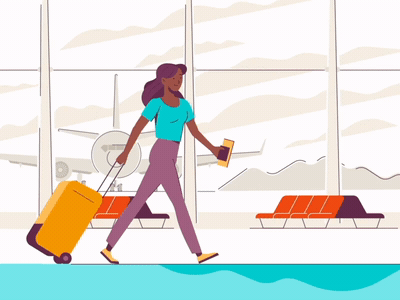



In [ ]:
# Import libraries
%matplotlib inline
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import pydot
from IPython.display import Image

from sklearn.utils import shuffle
#ls import shuffle
from imblearn.over_sampling import SMOTE

from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix, plot_roc_curve
import time

from sklearn.inspection import permutation_importance
from itertools import groupby
from graphviz import Source

from scipy import stats

from prettytable import PrettyTable

from collections import Counter
from io import StringIO

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

sns.set()

In [ ]:
# find the location of graphviz so dot.exe is in the PATH
import os
common_path = r'C:\\Program Files\\Anaconda3'
dot_path = os.path.join(common_path, 'Library', 'bin', 'graphviz')
os.environ["PATH"] += os.pathsep + dot_path

In [ ]:
def plot_tree(estimator, features, class_names=None, filled=True):
    tree = estimator
    names = features
    color = filled
    classn = class_names
    
    dot_data = StringIO()
    export_graphviz(estimator, out_file=dot_data, feature_names=features, class_names=classn, filled=filled)
    graph = pydot.graph_from_dot_data(dot_data.getvalue())
    return(graph)

In [ ]:
## Reading the dataset
air_df = pd.read_csv('Invistico_Airline.csv')
air_df.head()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0


In [ ]:
air_df.shape

(129880, 23)

In [ ]:
## checking the data types
air_df.dtypes

satisfaction                          object
Gender                                object
Customer Type                         object
Age                                    int64
Type of Travel                        object
Class                                 object
Flight Distance                        int64
Seat comfort                           int64
Departure/Arrival time convenient      int64
Food and drink                         int64
Gate location                          int64
Inflight wifi service                  int64
Inflight entertainment                 int64
Online support                         int64
Ease of Online booking                 int64
On-board service                       int64
Leg room service                       int64
Baggage handling                       int64
Checkin service                        int64
Cleanliness                            int64
Online boarding                        int64
Departure Delay in Minutes             int64
Arrival De

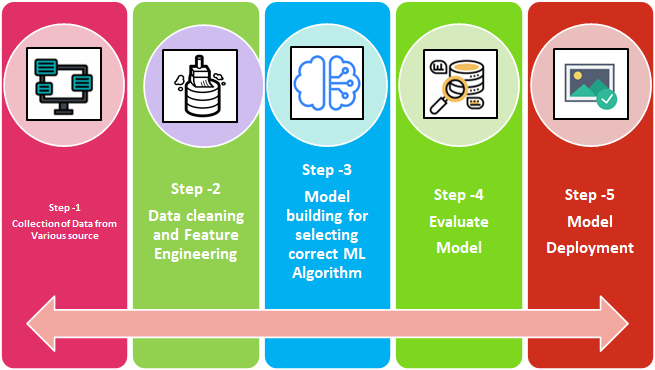

## Abstract

Given that the global airline industry is considered one of the most competitive markets, numerous attempts have been made to explore strategies for success in this industry. Among these, improving customers’ perceived satisfaction is an important topic for airline service providers. 

In this notebook, we have used H2O AutoML to create a predictive model and interpret them. We have created multivariate models.

**AutoML(Automated Machine Learning)** is the process of automating the time-consuming, iterative tasks of machine learning model development. It allows data scientists, analysts, and developers to build ML models with high scale, efficiency, and productivity all while sustaining model quality. 

**What is SHAP or SHapley Additive exPlanations?**

SHAP stands for “SHapley Additive exPlanations.” Shapley values are a widely used approach from cooperative game theory. The essence of Shapley value is to measure the contributions to the final outcome from each player separately among the coalition, while preserving the sum of contributions being equal to the final outcome. When using SHAP values in model explanation, we can measure the input features’ contribution to individual predictions.

**Model Interpretability, What it is?**

Interpretability is about the extent to which a cause and effect can be observed within a system. Or to put it another way, it is the extent to which you are able to predict what is going to happen, given a change in input or algorithmic parameters. It’s being able to understand which inputs are the most predictive (i.e., impact the prediction/output the most), and anticipate how predictions will change with differing inputs.

# About the data:

The data is obtained from Kaggle. It consists of 1,29,880 rows and 23 columns. The dataset consists of the details of customers who have already flown with them. The feedback of the customers on various context and their flight data has been consolidated.

The main purpose of this dataset is to predict whether a future customer would be satisfied with their service given the details of the other parameters values.
It includes several categorical and numeric variables.

Features:

  1. satisfaction: **Categorical**, used for binary classification.
  2. Gender: **Categorical**
  3. Customer Type: **Categorical**
  4. Age: Numerical
  5. Type of Travel: **Categorical**
  6. Class: **Categorical**(Used for multiclass classification)
  7. Flight Distance: **Numerical**(Used for Regression)
  8. Seat comfort: **Categorical**
  9. Departure/Arrival time convenient: **Categorical**
  10. Food and drink: **Categorical**
  11. Gate location: **Numerical**
  12. Inflight wifi service: **Categorical**
  13. Inflight entertainment: **Categorical**
  14. Online support: **Categorical**
  15. Ease of Online booking: **Categorical**
  16. On-board service: **Categorical**
  17. Leg room service: **Categorical**
  18. Baggage handling: **Categorical**
  19. Checkin service: **Categorical**
  20. Cleanliness: **Categorical**
  21. Online boarding: **Categorical**
  22. Departure Delay in Minutes: **Numerical**
  23. Arrival Delay in Minutes: **Numerical**

## Data Discovery and EDA

In [ ]:
Categorical_columns = air_df.select_dtypes(include=['object'])
Numerical_columns = air_df.select_dtypes(exclude=['object'])

In [ ]:
Numerical_columns.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,129880.0,39.427957,15.119360,7.0,27.0,40.0,51.0,85.0
Flight Distance,129880.0,1981.409055,1027.115606,50.0,1359.0,1925.0,2544.0,6951.0
Seat comfort,129880.0,2.838597,1.392983,0.0,2.0,3.0,4.0,5.0
Departure/Arrival time convenient,129880.0,2.990645,1.527224,0.0,2.0,3.0,4.0,5.0
Food and drink,129880.0,2.851994,1.443729,0.0,2.0,3.0,4.0,5.0
Gate location,129880.0,2.990422,1.305970,0.0,2.0,3.0,4.0,5.0
Inflight wifi service,129880.0,3.249130,1.318818,0.0,2.0,3.0,4.0,5.0
Inflight entertainment,129880.0,3.383477,1.346059,0.0,2.0,4.0,4.0,5.0
Online support,129880.0,3.519703,1.306511,0.0,3.0,4.0,5.0,5.0
Ease of Online booking,129880.0,3.472105,1.305560,0.0,2.0,4.0,5.0,5.0


In [ ]:
Categorical_columns.describe().T

,count,unique,top,freq
satisfaction,129880,2,satisfied,71087
Gender,129880,2,Female,65899
Customer Type,129880,2,Loyal Customer,106100
Type of Travel,129880,2,Business travel,89693
Class,129880,3,Business,62160


All columns is Numeric expcept [ ' satisfaction ' , ' Gender ' , ' Customer Type ' , ' Type of Travel ' , ' Class ' ]


In [ ]:
## checking null
air_df.isna().sum() 

satisfaction                           0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Seat comfort                           0
Departure/Arrival time convenient      0
Food and drink                         0
Gate location                          0
Inflight wifi service                  0
Inflight entertainment                 0
Online support                         0
Ease of Online booking                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Cleanliness                            0
Online boarding                        0
Departure Delay in Minutes             0
Arrival Delay in Minutes             393
dtype: int64

In [ ]:
air_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type of Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight Distance                    129880 non-null  int64  
 7   Seat comfort                       129880 non-null  int64  
 8   Departure/Arrival time convenient  129880 non-null  int64  
 9   Food and drink                     129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Inflight wifi service              1298

In [ ]:
# Satisfaction Analysis
air_df.satisfaction.value_counts(normalize=True)

satisfied       0.547328
dissatisfied    0.452672
Name: satisfaction, dtype: float64

In [ ]:
# Gender Analysis
air_df.Gender.value_counts(normalize=True)

Female    0.507384
Male      0.492616
Name: Gender, dtype: float64

In [ ]:
# Customer Type Analysis
air_df.Class.value_counts(normalize=True)

Business    0.478596
Eco         0.448945
Eco Plus    0.072459
Name: Class, dtype: float64

## Checking Correlation among features

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fe1a59cce50> (for post_execute):


KeyboardInterrupt: ignored

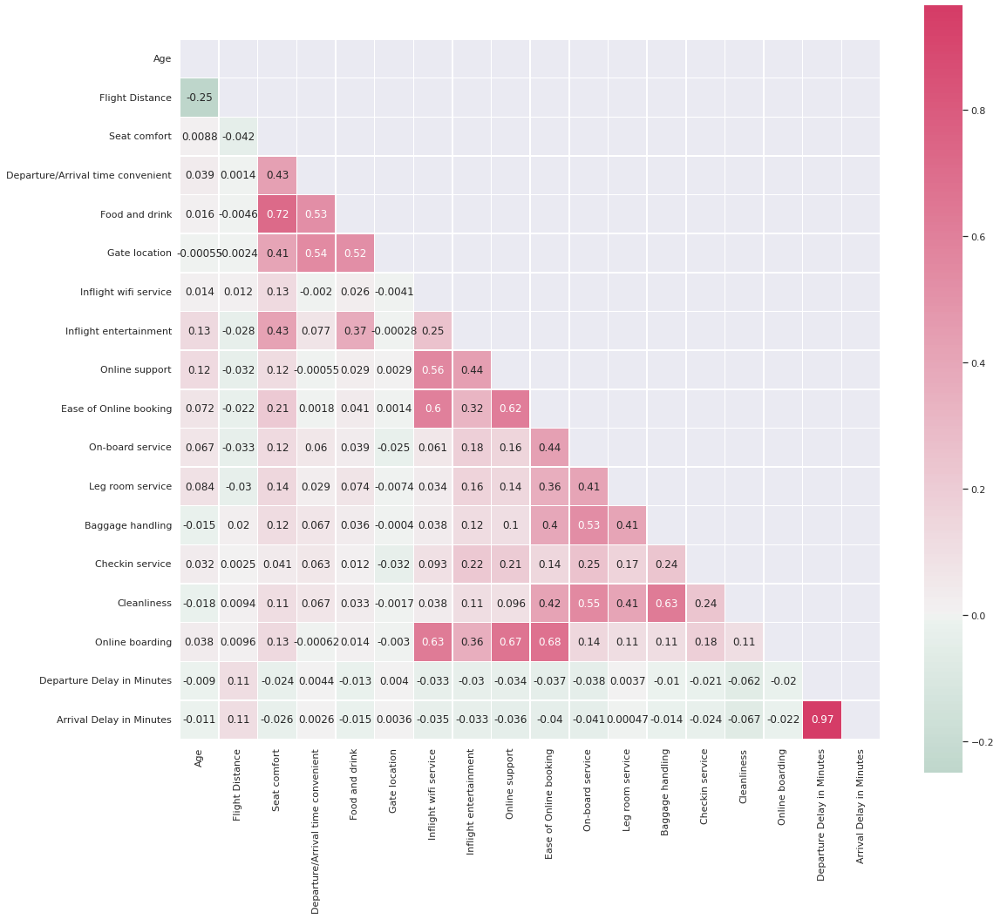

In [ ]:
corr = air_df.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(18, 18))
cmap = sns.diverging_palette(150, 1, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})

*   There is a significat correlation between Departure Delay in Minutes and Arrival Delay in Minutes so we will drop one of 2 freatures to avoid multicolinearity problem

In [ ]:
target = ['satisfaction']
drop_cols = ["Arrival Delay in Minutes"]
#numeric_variables = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']
categorical_variables = ['Gender' , 'Customer Type' , 'Type of Travel' , 'Class']

In [ ]:
## dropping columns
air_df.drop(columns = drop_cols, inplace = True)

Let's check how many people are satisfied and dissatisfied!

In [ ]:
fig=px.pie(air_df,values=air_df["satisfaction"].value_counts(),
           names=["Satisfied","Dissatisfied"],title="<b>Satisfied And Dissatisfied Ratio",
           hole=.4,
       color_discrete_sequence=px.colors.qualitative.Pastel,template="plotly")
fig.update_layout(title_font_size=20)
fig.show()

54.7% is Dissatisfied and 45.3% is Satisfied

Now, lets check what type of customers we have and which type has the most satisfied people

In [ ]:
fig=px.violin(air_df,y="Age",x="Customer Type",color="satisfaction",title="<b>Age vs Customer Type vs satisfaction")
fig.update_layout(template="plotly_dark")
fig.show()

*   Loyal Customers much more than Disloyal Customers that looks good
*   As we see Disloyal Customers have less dissatisfaction than the loyal customers and in Loyal Customers we have more dissatisfaction and that's a problem.

Which Class has more dissatisfied people?

In [ ]:
fig=px.histogram(air_df,x="Class",color="satisfaction",title="<b>Count of satisfied and dissatisfied in each class",
                color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(template="plotly")
fig.update_layout(title_font_size=25)
fig.show()

It can be seen that the more dissatisfied people is in class Eco.

In [ ]:
x_predictor_col = ['Departure/Arrival time convenient','Inflight wifi service', 'Online support',
       'Ease of Online booking', 'On-board service', 'Checkin service', 'Cleanliness',
       'Food and drink']

In [ ]:
def create_plot_pivot(df, x_column):
    _df_plot = df.groupby([x_column, 'satisfaction']).size() \
    .reset_index().pivot(columns='satisfaction', index=x_column, values=0)
    return _df_plot

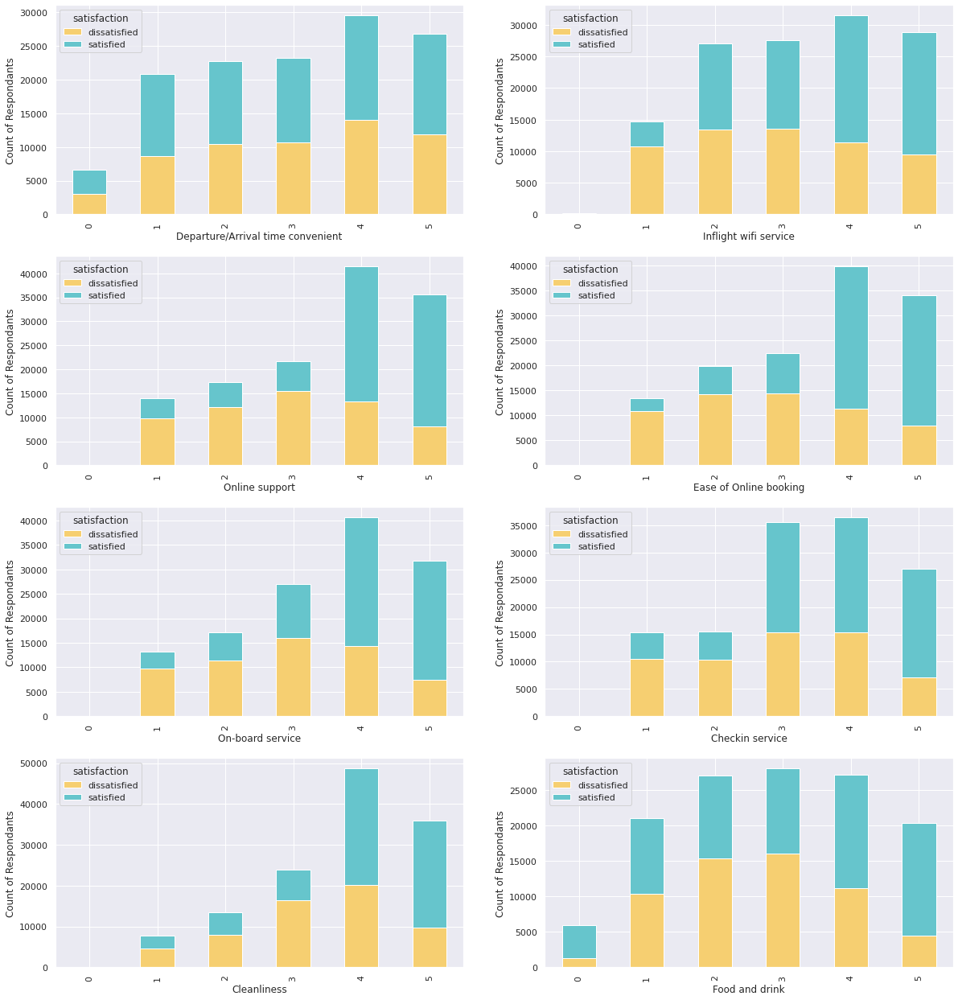

In [ ]:
fig, ax = plt.subplots(4,2 , figsize=(20,22))
axe = ax.ravel()

for i in range(0,8):
    create_plot_pivot(air_df, x_predictor_col[i]).plot(kind='bar',stacked=True, ax=axe[i],color=["#F6CF71","#66C5CC"])
    plt.xlabel(x_predictor_col[i])
    axe[i].set_ylabel('Count of Respondants')
fig.show()

Observations:
1. Ease of online booking is an important factor affect the satisfaction
2. online suuport is an important factor affect the satisfaction
3. On board service is an important factor affect the satisfaction

Plotting for column satisfaction


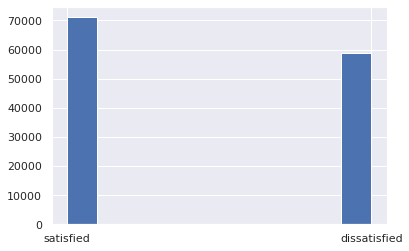

Plotting for column Gender


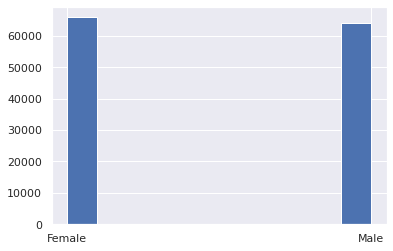

Plotting for column Customer Type


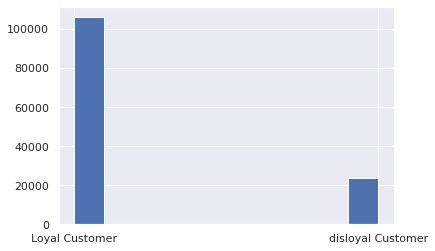

Plotting for column Age


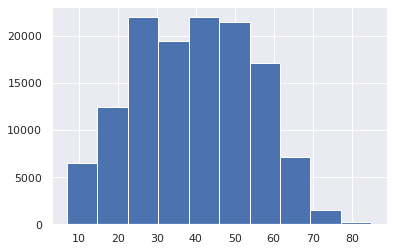

Plotting for column Type of Travel


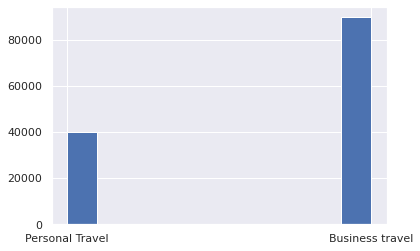

Plotting for column Class


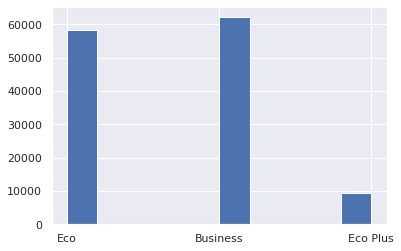

Plotting for column Flight Distance


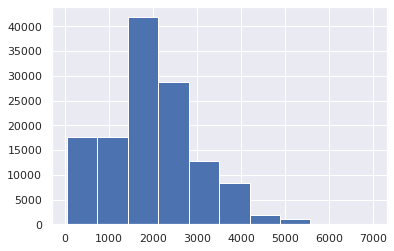

Plotting for column Seat comfort


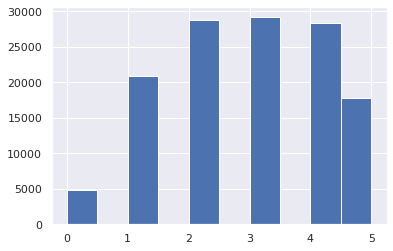

Plotting for column Departure/Arrival time convenient


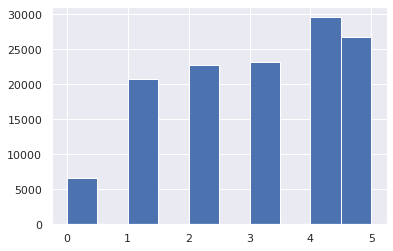

Plotting for column Food and drink


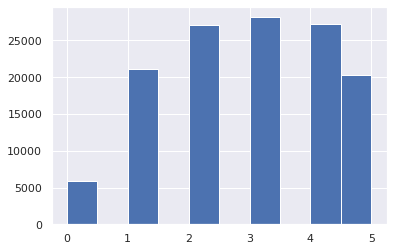

Plotting for column Gate location


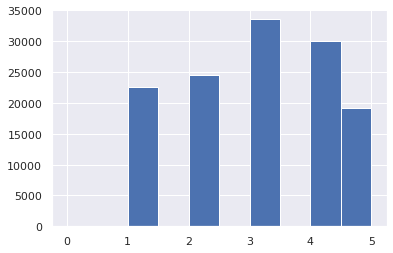

Plotting for column Inflight wifi service


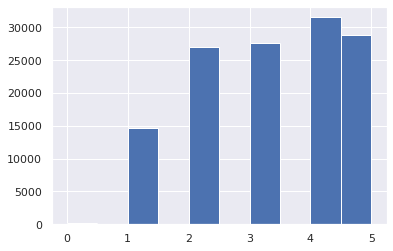

Plotting for column Inflight entertainment


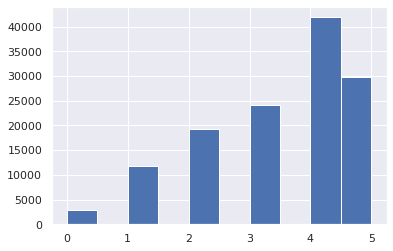

Plotting for column Online support


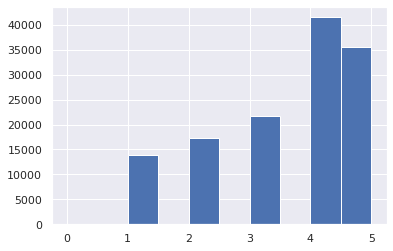

Plotting for column Ease of Online booking


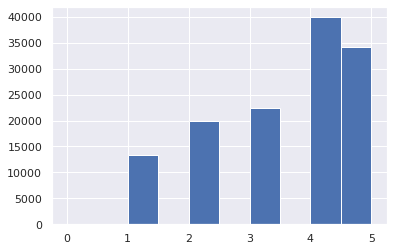

Plotting for column On-board service


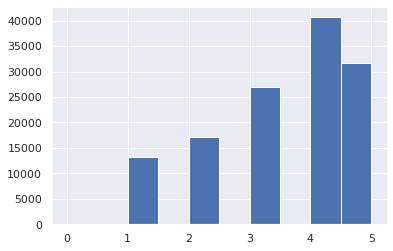

Plotting for column Leg room service


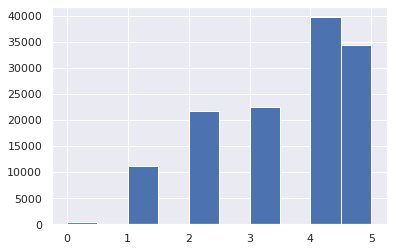

Plotting for column Baggage handling


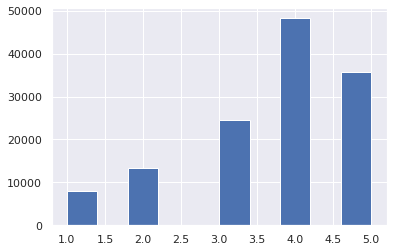

Plotting for column Checkin service


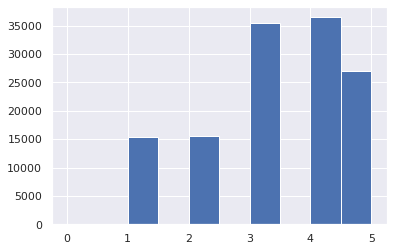

Plotting for column Cleanliness


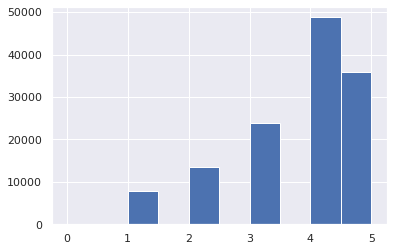

Plotting for column Online boarding


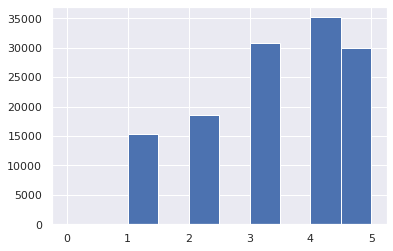

Plotting for column Departure Delay in Minutes


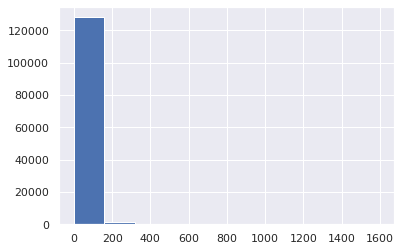

In [ ]:
for col in air_df.columns:
    hist = air_df[col].hist(bins=10)
    print("Plotting for column {}".format(col))
    plt.show()

## Encoding and Detecting Outliers

#### <span style="color:black"><u>Outliers:</u></span> 

- Can be observed from distribution plots and count plots of different features

- Outliers can either be logically improbable (as per the feature definition) or just an extreme value as compared to the feature distribution(eg. negative age or tenure)

- As part of outlier treatment, the particular row containing the outlier can be removed from the training set, provided they do not form a significant chunk of the dataset (< 0.5-1%)

- In cases where the value of outlier is logically faulty, e.g. negative Age or CreditScore > 900, the particular record can be replaced with mean of the feature or the nearest among min/max logical value of the feature

In [ ]:
from sklearn.preprocessing import LabelEncoder
for i in air_df.select_dtypes(include=['object']):
        le = LabelEncoder()
        air_df[i] = le.fit_transform(air_df[i])

In [ ]:
Q1 = air_df.quantile(0.25)
Q3 = air_df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

satisfaction                            1.0
Gender                                  1.0
Customer Type                           0.0
Age                                    24.0
Type of Travel                          1.0
Class                                   1.0
Flight Distance                      1185.0
Seat comfort                            2.0
Departure/Arrival time convenient       2.0
Food and drink                          2.0
Gate location                           2.0
Inflight wifi service                   2.0
Inflight entertainment                  2.0
Online support                          2.0
Ease of Online booking                  3.0
On-board service                        1.0
Leg room service                        3.0
Baggage handling                        2.0
Checkin service                         1.0
Cleanliness                             2.0
Online boarding                         2.0
Departure Delay in Minutes             12.0
dtype: float64


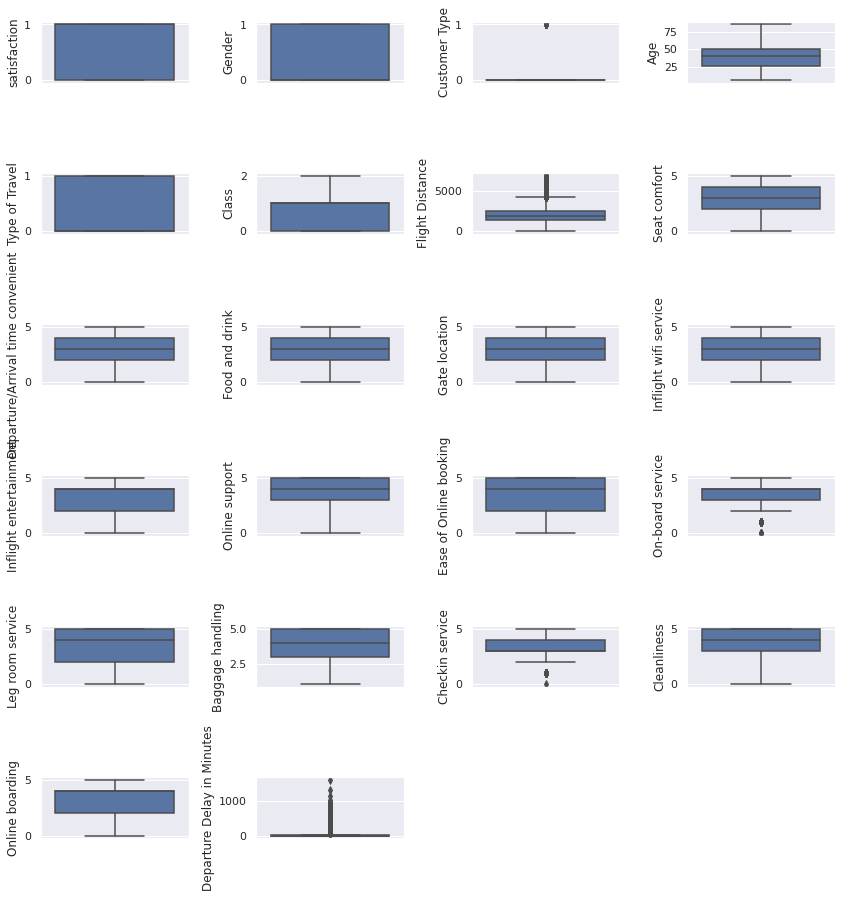

In [ ]:
fig = plt.figure(figsize=(12,18))
for i in range(len(air_df.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=air_df.iloc[:,i])

plt.tight_layout()
plt.show()

In [ ]:
from collections import Counter
def detect_outliers(df,features):
    outlier_indices=[]
    
    for c in features:
        Q1=np.percentile(df[c],25)
        
        Q3=np.percentile(df[c],75)
        
        IQR= Q3-Q1
        
        outlier_step= IQR * 1.5
        
        outlier_list_col = df[(df[c]< Q1 - outlier_step)|( df[c] > Q3 + outlier_step)].index
        
        outlier_indices.extend(outlier_list_col)
    
    outliers_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i , v in outliers_indices.items() if v>2 )
    return multiple_outliers

In [ ]:
air_df = air_df.drop(detect_outliers(air_df,[ 'Age', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service','Leg room service',
       'Baggage handling', 'Checkin service',
       'Cleanliness', 'Departure Delay in Minutes']),axis = 0).reset_index(drop = True)

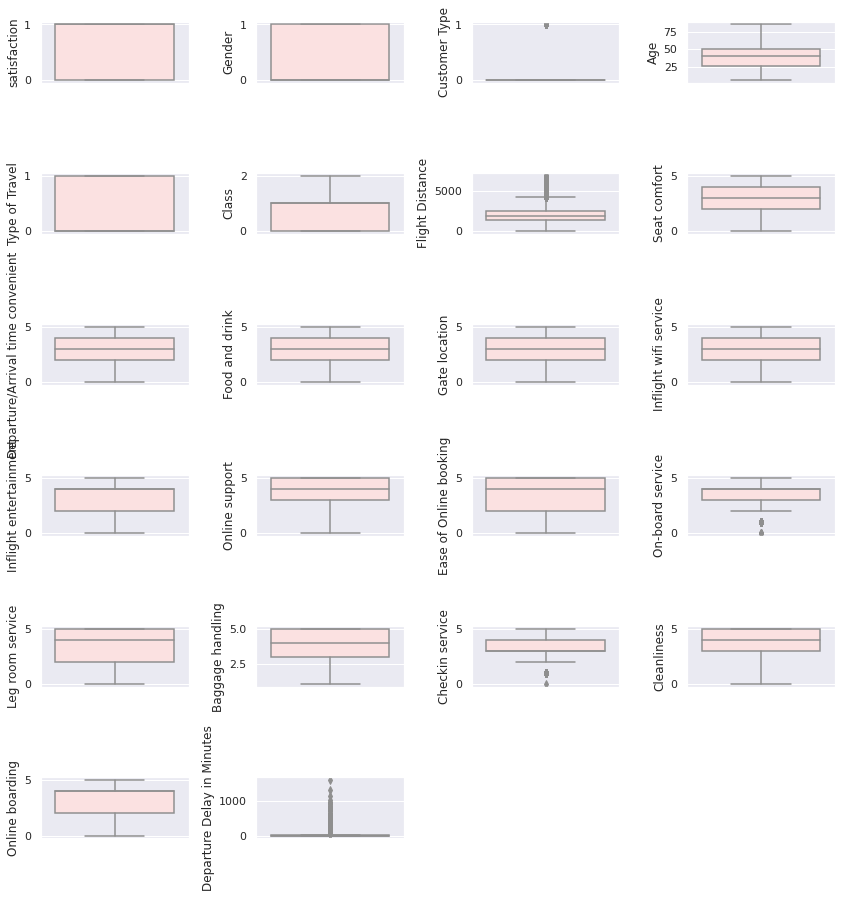

In [ ]:
fig = plt.figure(figsize=(12,18))
for i in range(len(air_df.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=air_df.iloc[:,i],color="#FFDDDD")

plt.tight_layout()
plt.show()

## Feature Importance

In [ ]:
from sklearn import preprocessing
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(air_df)
modified_data = pd.DataFrame(r_scaler.transform(air_df), columns=air_df.columns)
modified_data.head()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes
0,1.0,0.0,0.0,0.743590,1.0,0.5,0.031155,0.0,0.0,0.0,...,0.8,0.4,0.6,0.6,0.0,0.50,1.0,0.6,0.4,0.000000
1,1.0,1.0,0.0,0.512821,1.0,0.0,0.349804,0.0,0.0,0.0,...,0.4,0.4,0.6,0.8,0.8,0.75,0.4,0.6,0.4,0.194724
2,1.0,0.0,0.0,0.102564,1.0,0.5,0.302565,0.0,0.0,0.0,...,0.0,0.4,0.4,0.6,0.6,0.75,0.8,0.8,0.4,0.000000
3,1.0,0.0,0.0,0.679487,1.0,0.5,0.083031,0.0,0.0,0.0,...,0.8,0.6,0.2,0.2,0.0,0.00,0.8,0.2,0.6,0.000000
4,1.0,0.0,0.0,0.807692,1.0,0.5,0.044052,0.0,0.0,0.0,...,0.6,0.8,0.4,0.4,0.0,0.25,0.8,0.4,1.0,0.000000


In [ ]:
from sklearn.feature_selection import SelectKBest, chi2 
X = modified_data.loc[:,modified_data.columns!='satisfaction'] 
y = modified_data[['satisfaction']] 
selector = SelectKBest(chi2, k=10) 
selector.fit(X, y) 
X_new = selector.transform(X) 
print(X.columns[selector.get_support(indices=True)])

Index(['Gender', 'Customer Type', 'Class', 'Inflight entertainment',
       'Online support', 'Ease of Online booking', 'On-board service',
       'Leg room service', 'Baggage handling', 'Online boarding'],
      dtype='object')


From all above results, finally we can combine and conclude the list of important features.

**Really Important Features**: Seat comfort,Customer Type,Inflight_entertainment,Gender,Checkin_service

**Important Features**: Type of Travel,Online support, Baggage handling,cleanliness,Online boarding,On_board service,Class

In [ ]:
x = modified_data[['Seat comfort','Inflight entertainment','Ease of Online booking','Online support','Gender',
                   'Customer Type', 'Type of Travel', 'Class','On-board service', 'Leg room service', 'Online boarding']]
y = modified_data["satisfaction"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state=42)

In [ ]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm
model_3 = sm.Logit(y_train.values, X_train).fit()

# Print out the statistics
model_3.summary()


Optimization terminated successfully.
         Current function value: 0.472118
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                90463
Model:                          Logit   Df Residuals:                    90452
Method:                           MLE   Df Model:                           10
Date:                Thu, 15 Dec 2022   Pseudo R-squ.:                  0.3139
Time:                        23:38:31   Log-Likelihood:                -42709.
converged:                       True   LL-Null:                       -62251.
Covariance Type:            nonrobust   LLR p-value:                     0.000
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Seat comfort              -0.1161      0.036     -3.224      0.001      -0.187      -0.046
Inflight entertainment     2.1124      0.041     52.035      0.000       2.033       2.192
Ease of Online booking     1.8204      0.054     33.517      0.000       1.714       1.927
Online support            -0.7926      0.047    -16.753      0.000      -0.885      -0.700
Gender                    -1.4237      0.017    -84.437      0.000      -1.457      -1.391
Customer Type             -2.1049      0.024    -87.354      0.000      -2.152      -2.058
Type of Travel            -0.7077      0.022    -32.778      0.000      -0.750      -0.665
Class                     -1.9113      0.031    -61.998      0.000      -1.972      -1.851
On-board service           0.4679      0.038     12.394      0.000       0.394       0.542
Leg room service          -0.0342      0.035     -0.991      0.322      -0.102       0.033
Online boarding           -0.0784      0.051     -1.537      0.124      -0.178       0.022
==========================================================================================
"""

## Modelling

### Logistic Regression

In [ ]:
#from sklearn.preprocessing import StandardScaler
#sc = StandardScaler()
#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)

Accuracy = 0.822496195610121
ROC Area under Curve = 0.8201320313753048
Time taken = 0.5610623359680176
              precision    recall  f1-score   support

         0.0    0.80955   0.79507   0.80224     17557
         1.0    0.83287   0.84520   0.83899     21214

    accuracy                        0.82250     38771
   macro avg    0.82121   0.82013   0.82061     38771
weighted avg    0.82231   0.82250   0.82235     38771



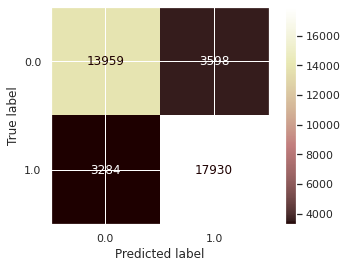

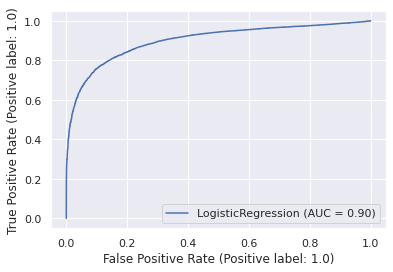

In [ ]:
from sklearn.linear_model import LogisticRegression
import time
t0=time.time()
model= LogisticRegression()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
roc_auc5 = roc_auc_score(y_test, y_pred) 
time_taken5 = time.time()-t0
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc5))
print("Time taken = {}".format(time_taken5))
print(classification_report(y_test,y_pred,digits=5))
plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.pink)
plot_roc_curve(model, X_test, y_test) 

In [ ]:
# Getting the coefficients
log_odds = model.coef_[0]
pd.DataFrame(log_odds, 
             X_train.columns, 
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
Inflight entertainment,3.444624
On-board service,2.068947
Leg room service,1.361598
Ease of Online booking,1.174706
Online boarding,0.836507
Online support,0.508373
Seat comfort,0.422190
Type of Travel,-0.744792
Gender,-0.956703
Class,-1.050899


In [ ]:
odds = np.exp(model.coef_[0])
pd.DataFrame(odds, 
             X_train.columns, 
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
Inflight entertainment,31.331492
On-board service,7.916482
Leg room service,3.902426
Ease of Online booking,3.237192
Online boarding,2.308289
Online support,1.662584
Seat comfort,1.525298
Type of Travel,0.474833
Gender,0.384157
Class,0.349623


### Tree Model

A decision tree is a flowchart-like tree structure where an internal node represents feature(or attribute), the branch represents a decision rule, and each leaf node represents the outcome. The topmost node in a decision tree is known as the root node. It learns to partition on the basis of the attribute value. It partitions the tree in recursively manner call recursive partitioning. This flowchart-like structure helps you in decision making. It's visualization like a flowchart diagram which easily mimics the human level thinking.

**criterion** : optional (default=”gini”) or Choose attribute selection measure: This parameter allows us to use the different-different attribute selection measure. Supported criteria are “gini” for the Gini index and “entropy” for the information gain.

**splitter** : string, optional (default=”best”) or Split Strategy: This parameter allows us to choose the split strategy. Supported strategies are “best” to choose the best split and “random” to choose the best random split.

**max_depth** : int or None, optional (default=None) or Maximum Depth of a Tree: The maximum depth of the tree. If None, then nodes are expanded until all the leaves contain less than min_samples_split samples. The higher value of maximum depth causes overfitting, and a lower value causes underfitting.

In [ ]:
X = pd.get_dummies(air_df[air_df.columns.difference(['satisfaction'])], drop_first=True)
y = pd.get_dummies(air_df.satisfaction, drop_first=True)
clf = DecisionTreeClassifier(max_depth=20, min_impurity_decrease=0.01)
clf.fit(X, y)

DecisionTreeClassifier(max_depth=20, min_impurity_decrease=0.01)

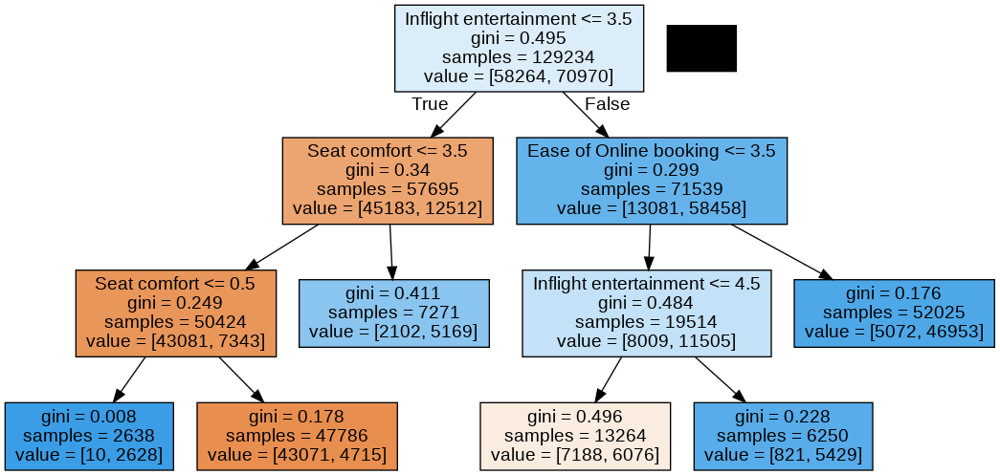

In [ ]:
# unpruned tree
graph, = plot_tree(clf, X.columns)
s = Source(graph, filename="test.gv", format="png")
Image(s.view())

In [ ]:
accuracy_score(y_test,y_pred)*100

82.2496195610121

In [ ]:
roc_auc_score(y_test,y_pred)*100

82.01320313753048

### Naive Bayes Classifier

Accuracy = 0.8252044053545176
ROC Area under Curve = 0.8231468383127206
Time taken = 0.08868241310119629
              precision    recall  f1-score   support

         0.0    0.81052   0.80133   0.80590     17557
         1.0    0.83711   0.84496   0.84102     21214

    accuracy                        0.82520     38771
   macro avg    0.82381   0.82315   0.82346     38771
weighted avg    0.82507   0.82520   0.82511     38771



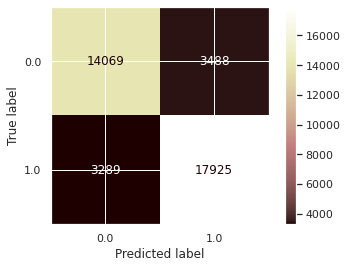

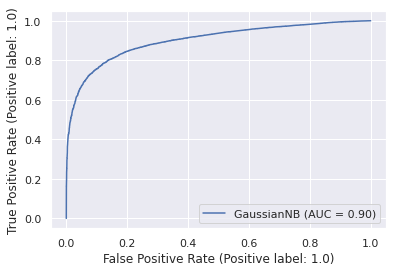

In [ ]:
from sklearn.naive_bayes import GaussianNB
import time
t0=time.time()
model_2= GaussianNB()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
roc_auc4 = roc_auc_score(y_test, y_pred)
time_taken1 = time.time()-t0
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc4))
print("Time taken = {}".format(time_taken1))
print(classification_report(y_test,y_pred,digits=5))
plot_confusion_matrix(model_2, X_test, y_test,cmap=plt.cm.pink)
plot_roc_curve(model_2,X_test, y_test) 

### AutoML

In [ ]:
!pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import h2o
from h2o.automl import H2OAutoML
h2o.init(max_mem_size_GB = 200, nthreads = 10)

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,54 mins 55 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.3
H2O_cluster_version_age:,22 days
H2O_cluster_name:,H2O_from_python_unknownUser_dc6r08
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,200.0 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
data = h2o.H2OFrame(air_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
data.shape

(129234, 22)

In [ ]:
# Partition data into 70%, 15%, 15% chunks
# Setting a seed will guarantee reproducibility
splits = data.split_frame(ratios=[0.7, 0.15], seed=1)  

train = splits[0]
valid = splits[1]
test = splits[2]

In [ ]:
y = 'satisfaction'
x = list(data.columns)

In [ ]:
x.remove(y)  #remove the response

In [ ]:
target=y
#data=h2o.deep_copy(df, 'data')
#data=h2o.deep_copy(data, 'df')

splits = data.split_frame(ratios=[0.75], seed=1)  

train = splits[0]
test = splits[1]

print ("Rows in Train",train.nrow)
print ("Rows in Test",test.nrow)

Rows in Train 97429
Rows in Test 32451


In [ ]:
# Set up AutoML
import time
aml = H2OAutoML(max_runtime_secs=60)

In [ ]:
# set model start time and train the aml model
model_start_time = time.time()
aml.train(x=x,y=y,training_frame=data)

AutoML progress: |
23:48:42.989: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██████████████████
23:49:01.58: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
23:49:02.191: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█████████████████████████
23:49:25.545: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███

Model Details
=============
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_BestOfFamily_2_AutoML_3_20221215_234842

No summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.018212009984640228
RMSE: 0.13495188025603877
MAE: 0.06308189782876239
RMSLE: 0.09394883886882265
Mean Residual Deviance: 0.018212009984640228
R^2: 0.9263778838882278
Null degrees of freedom: 10083
Residual degrees of freedom: 10080
Null deviance: 2494.7404620565308
Residual deviance: 183.64990868511205
AIC: -11766.064412088648

ModelMetricsRegressionGLM: stackedensemble
** Reported on validation data. **

MSE: 0.03288868670847191
RMSE: 0.18135238269312018
MAE: 0.08411238708848977
RMSLE: 0.12795291015275634
Mean Residual Deviance: 0.03288868670847191
R^2: 0.8674487605039245
Null degrees of freedom: 12801
Residual degrees of freedom: 12798
Null deviance: 3176.552268058239
Residual deviance: 421.0409672418574
AIC: -7373.546881127742

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

In [ ]:
# printing the leaderBoard for models used
print(aml.leaderboard)

model_id                                                     rmse        mse        mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_2_AutoML_3_20221215_234842  0.181352  0.0328887  0.0841124  0.127953                 0.0328887
StackedEnsemble_AllModels_1_AutoML_3_20221215_234842     0.181352  0.0328887  0.0841124  0.127953                 0.0328887
StackedEnsemble_BestOfFamily_1_AutoML_3_20221215_234842  0.182198  0.0331962  0.0864449  0.128457                 0.0331962
GBM_1_AutoML_3_20221215_234842                           0.184164  0.0339164  0.0892606  0.129912                 0.0339164
XGBoost_1_AutoML_3_20221215_234842                       0.196173  0.0384837  0.0973737  0.139214                 0.0384837
DRF_1_AutoML_3_20221215_234842                           0.210157  0.044166   0.0743172  0.148153                 0.044166
XGBoost_2_AutoML_3_20221215_234842                       0.224941  0.0505983  0.165884   0.160613                 0.0505983
GBM_4_Aut

In [ ]:
# predicting on test data
prediction = aml.leader.predict(test)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [ ]:
# finding and storing the best model
best_model = h2o.get_model(aml.leaderboard[0,'model_id'])

In [ ]:
best_model.algo

'stackedensemble'

In [ ]:
best_model.model_performance(test)

ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 0.022397901172020115
RMSE: 0.14965928361454933
MAE: 0.06884061874918392
RMSLE: 0.1053493242652128
Mean Residual Deviance: 0.022397901172020115
R^2: 0.9097045798444552
Null degrees of freedom: 32450
Residual degrees of freedom: 32447
Null deviance: 8049.66863204012
Residual deviance: 726.8342909332248
AIC: -31172.521425996416

In [ ]:
aml.varimp(use_pandas=True)

,GLM_1,GBM_2,GBM_4,DRF_1,GBM_3,XGBoost_1,XGBoost_2,GBM_1
Inflight entertainment,0.147229,0.484275,0.467116,0.448716,0.283684,0.327818,0.343120,0.375385
Ease of Online booking,0.047068,0.062837,0.087319,0.029760,0.066479,0.092542,0.070575,0.087827
Online support,0.021078,0.007672,0.019739,0.027231,0.106807,0.010902,0.074703,0.050528
Customer Type,0.126357,0.035476,0.030946,0.021796,0.059784,0.023780,0.058169,0.042376
Leg room service,0.041503,0.009355,0.018589,0.072129,0.023354,0.011833,0.034956,0.020063
Class,0.046589,0.037023,0.009089,0.020296,0.028537,0.020683,0.028779,0.027161
Type of Travel,0.062552,0.029184,0.028195,0.021293,0.038292,0.033341,0.024553,0.022953
Gender,0.073667,0.026690,0.021821,0.012033,0.039039,0.020136,0.013388,0.031480
Online boarding,0.029269,0.008498,0.020134,0.016920,0.035985,0.009656,0.022839,0.015336
Inflight wifi service,0.009980,0.002437,0.012974,0.010872,0.008855,0.024202,0.002068,0.007370


### LightGBM

Similar to XGBoost, LightGBM (by Microsoft) is a distributed high-performance framework that uses decision trees for ranking, classification, and regression tasks.

In contrast to the level-wise (horizontal) growth in XGBoost, LightGBM carries out leaf-wise (vertical) growth that results in more loss reduction and in turn higher accuracy while being faster. But this may also result in overfitting on the training data which could be handled using the max-depth parameter that specifies where the splitting would occur. Hence, XGBoost is capable of building more robust models than LightGBM.

In [ ]:
import lightgbm as lgb
train_y = air_df.satisfaction
test_y = air_df.satisfaction
 
train_x = air_df.drop(['satisfaction'], axis = 1)
test_x = air_df.drop(['satisfaction'], axis = 1)

In [ ]:
train_data=lgb.Dataset(train_x, label=train_y)

In [ ]:
#Select Hyper-Parameters
params = {'boosting_type': 'gbdt',
          'max_depth' : -1,
          'objective': 'binary',
          'nthread': 5,
          'num_leaves': 64,
          'learning_rate': 0.05,
          'max_bin': 512,
          'subsample_for_bin': 200,
          'subsample': 1,
          'subsample_freq': 1,
          'colsample_bytree': 0.8,
          'reg_alpha': 5,
          'reg_lambda': 10,
          'min_split_gain': 0.5,
          'min_child_weight': 1,
          'min_child_samples': 5,
          'scale_pos_weight': 1,
          'num_class' : 1,
          'metric' : 'binary_error'
          }

In [ ]:
#Train model on selected parameters and number of iterations
lgbm = lgb.train(params,
                 train_data,
                 250,
                 #early_stopping_rounds= 40,
                 verbose_eval= 4
                 )

In [ ]:
#Predict on test set
#test_sample = test_x.sample(n=100)
predictions_lgbm_prob = lgbm.predict(test_x)
predictions_lgbm_01 = np.where(predictions_lgbm_prob > 0.5, 1, 0)

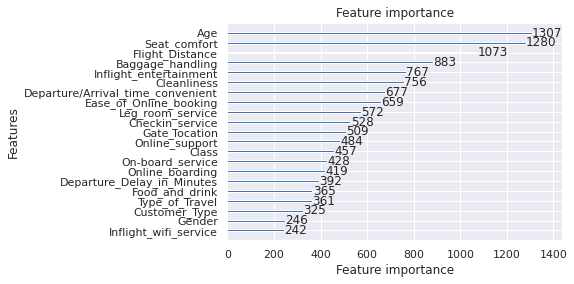

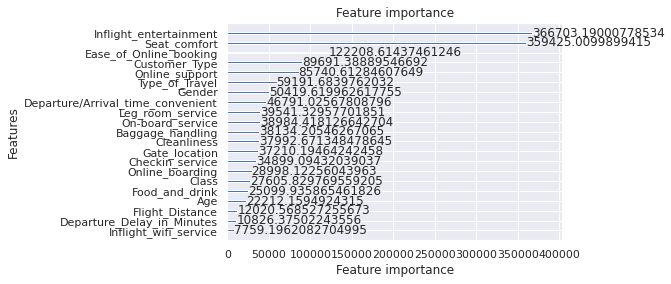

In [ ]:
#Plot Variable Importances (with both criteria)
lgb.plot_importance(lgbm, max_num_features=21, importance_type='split')
lgb.plot_importance(lgbm, max_num_features=21, importance_type='gain')

In [ ]:
import lightgbm as lgb
lgbm = lgb.LGBMClassifier()
lgbm.fit(X_train , y_train)

LGBMClassifier()

In [ ]:
accuracy_score(lgbm.predict(X_train) , y_train)

0.936725512087815

In [ ]:
accuracy_score(lgbm.predict(X_test) , y_test)

0.9333264553403317

## Model Interpretation using SHAP

In [ ]:
#Shap
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import shap
pd.set_option("display.max_columns",None)
shap.initjs()

In [ ]:
import xgboost

### For Logistic Regression

In [ ]:
explainer = shap.LinearExplainer(model, X_train, feature_names=air_df.columns)
shap_values = explainer(X_test)

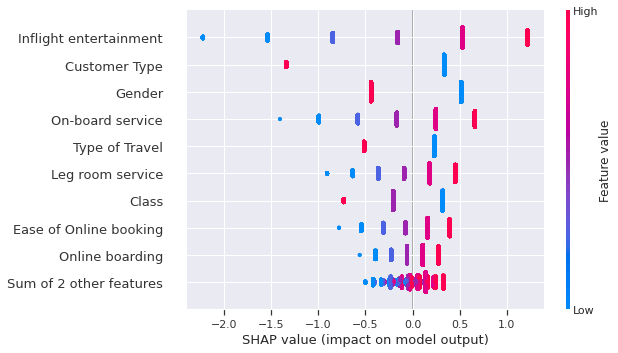

In [ ]:
shap.initjs()
shap.plots.beeswarm(shap_values)#, X_test_array, feature_names=vectorizer.get_feature_names())

In [ ]:
shap.initjs()
ind = 0
shap.plots.force(shap_values[ind])

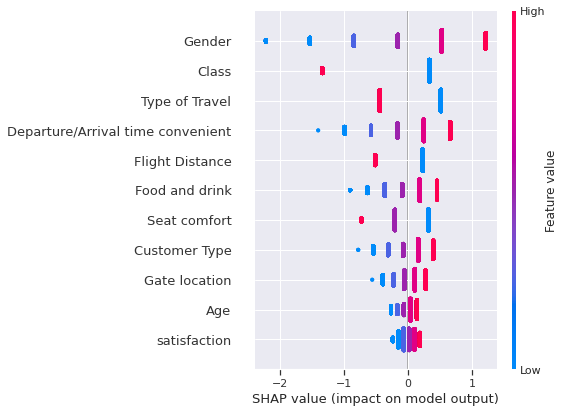

In [ ]:
shap.summary_plot(shap_values, X_test, feature_names=air_df.columns)

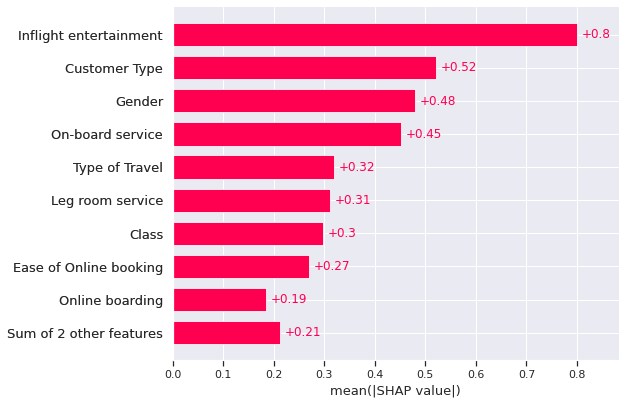

In [ ]:
shap.initjs()
shap.plots.bar(shap_values)

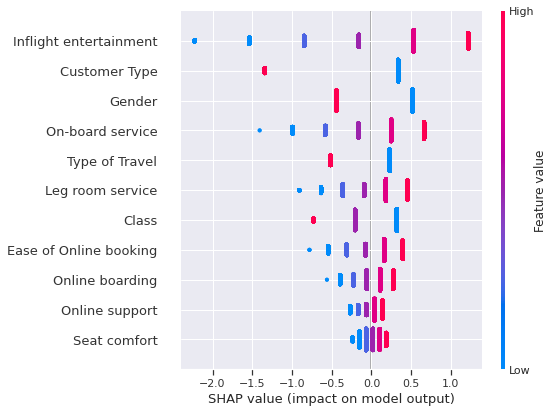

In [ ]:
shap.initjs()
shap.summary_plot(shap_values.values, X_test)

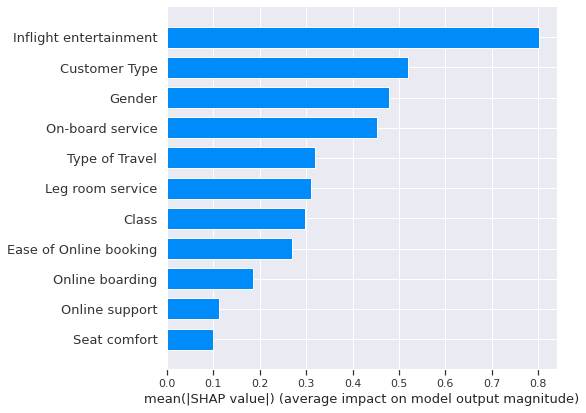

In [ ]:
shap.initjs()
shap.summary_plot(shap_values.values, X_test, plot_type='bar')

In [ ]:
def sample_feature_importance(idx, type='condensed'):
    if type == 'condensed':
        return shap.plots.force(shap_values[idx])
    elif type == 'waterfall':
        return shap.plots.waterfall(shap_values[idx])
    else:
        return "Return valid visual ('condensed', 'waterfall')"

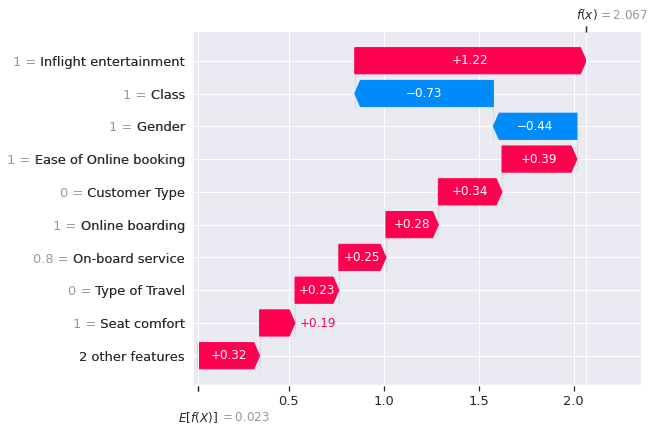

In [ ]:
sample_feature_importance(0, 'waterfall')

### Interpretting Tree Model

In [ ]:
# Define a tree explainer for the built model
import shap
shap.initjs()
explainer = shap.TreeExplainer(clf)
 # obtain shap values for the first row of the test data
shap_values = explainer.shap_values(X_train.iloc[0])
shap.force_plot(explainer.expected_value[0], shap_values[0], X_train.iloc[0]) 

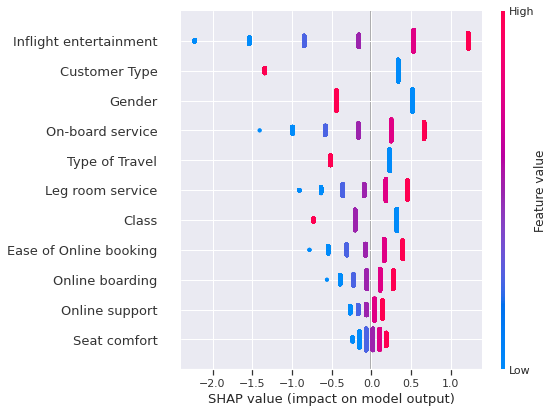

In [ ]:
shap.initjs()
shap.summary_plot(shap_values.values, X_test)

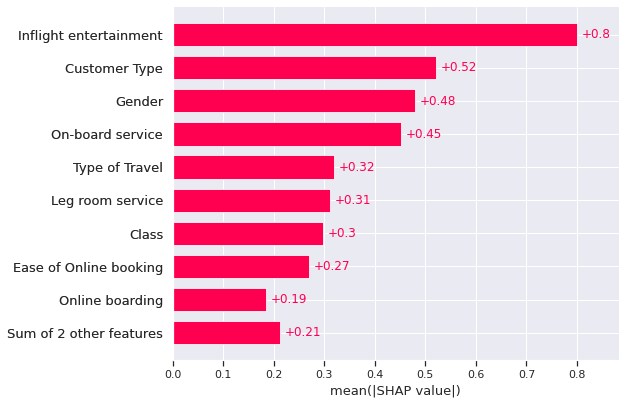

In [ ]:
shap.initjs()
shap.plots.bar(shap_values)

### AutoML

# Leaderboard

> Leaderboard shows models with their metrics and their predictions for a given row. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo,predict
XGBoost_1_AutoML_3_20221215_234842,0.136645,0.018672,0.0663371,0.0972949,0.018672,18046,0.019187,XGBoost,1.12867
StackedEnsemble_BestOfFamily_2_AutoML_3_20221215_234842,0.146918,0.0215849,0.0678066,0.103687,0.0215849,1209,0.063263,StackedEnsemble,1.07286
StackedEnsemble_AllModels_1_AutoML_3_20221215_234842,0.146918,0.0215849,0.0678066,0.103687,0.0215849,1658,0.055605,StackedEnsemble,1.07286
DRF_1_AutoML_3_20221215_234842,0.151941,0.0230859,0.0462964,0.10731,0.0230859,2371,0.00204,DRF,1
StackedEnsemble_BestOfFamily_1_AutoML_3_20221215_234842,0.153437,0.0235429,0.07257,0.108185,0.0235429,3928,0.058318,StackedEnsemble,1.08387
GBM_1_AutoML_3_20221215_234842,0.167342,0.0280033,0.0806786,0.11799,0.0280033,23344,0.060762,GBM,1.06157
XGBoost_2_AutoML_3_20221215_234842,0.216805,0.0470043,0.161377,0.154751,0.0470043,2140,0.001605,XGBoost,0.910721
GBM_4_AutoML_3_20221215_234842,0.288678,0.083335,0.270621,0.21064,0.083335,1700,0.003429,GBM,0.738296
GBM_3_AutoML_3_20221215_234842,0.323874,0.104894,0.307859,0.234686,0.104894,1703,0.003909,GBM,0.76122
GLM_1_AutoML_3_20221215_234842,0.357988,0.128156,0.282703,0.255717,0.128156,1107,0.001687,GLM,0.521339


# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

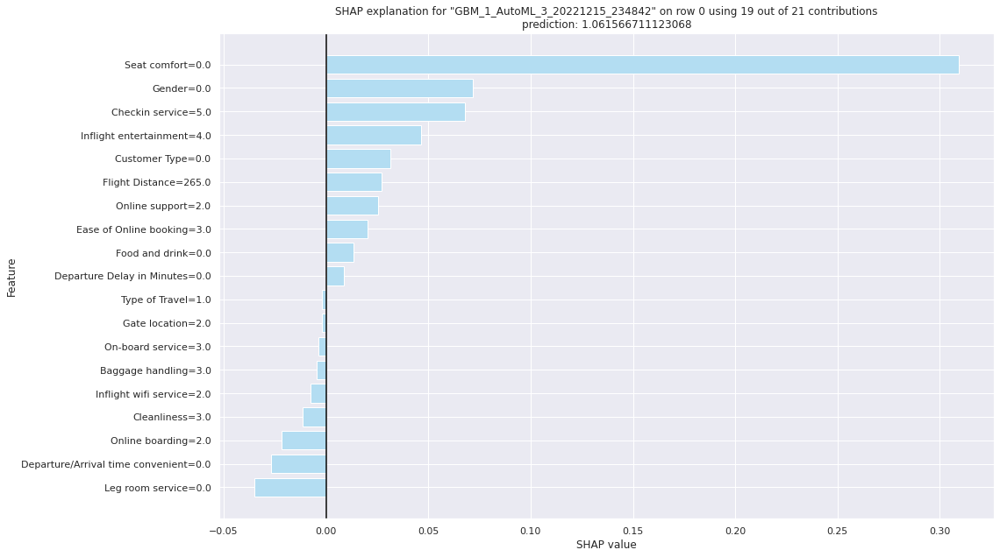

# Leaderboard

> Leaderboard shows models with their metrics and their predictions for a given row. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo,predict
XGBoost_1_AutoML_3_20221215_234842,0.136645,0.018672,0.0663371,0.0972949,0.018672,18046,0.019187,XGBoost,1.12867
StackedEnsemble_BestOfFamily_2_AutoML_3_20221215_234842,0.146918,0.0215849,0.0678066,0.103687,0.0215849,1209,0.063263,StackedEnsemble,1.07286
StackedEnsemble_AllModels_1_AutoML_3_20221215_234842,0.146918,0.0215849,0.0678066,0.103687,0.0215849,1658,0.055605,StackedEnsemble,1.07286
DRF_1_AutoML_3_20221215_234842,0.151941,0.0230859,0.0462964,0.10731,0.0230859,2371,0.00204,DRF,1
StackedEnsemble_BestOfFamily_1_AutoML_3_20221215_234842,0.153437,0.0235429,0.07257,0.108185,0.0235429,3928,0.058318,StackedEnsemble,1.08387
GBM_1_AutoML_3_20221215_234842,0.167342,0.0280033,0.0806786,0.11799,0.0280033,23344,0.060762,GBM,1.06157
XGBoost_2_AutoML_3_20221215_234842,0.216805,0.0470043,0.161377,0.154751,0.0470043,2140,0.001605,XGBoost,0.910721
GBM_4_AutoML_3_20221215_234842,0.288678,0.083335,0.270621,0.21064,0.083335,1700,0.003429,GBM,0.738296
GBM_3_AutoML_3_20221215_234842,0.323874,0.104894,0.307859,0.234686,0.104894,1703,0.003909,GBM,0.76122
GLM_1_AutoML_3_20221215_234842,0.357988,0.128156,0.282703,0.255717,0.128156,1107,0.001687,GLM,0.521339


# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

In [ ]:
aml.explain_row(data, row_index = 0)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

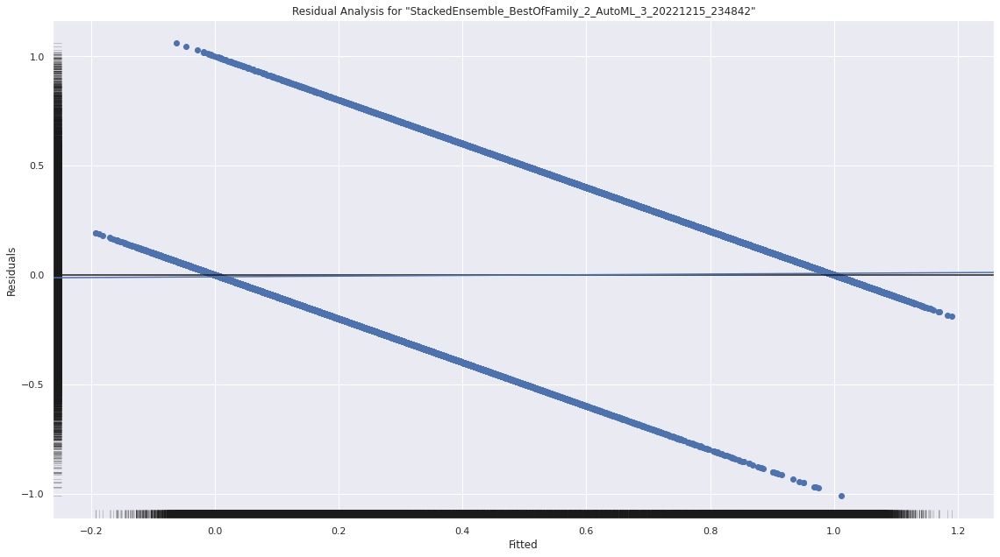

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

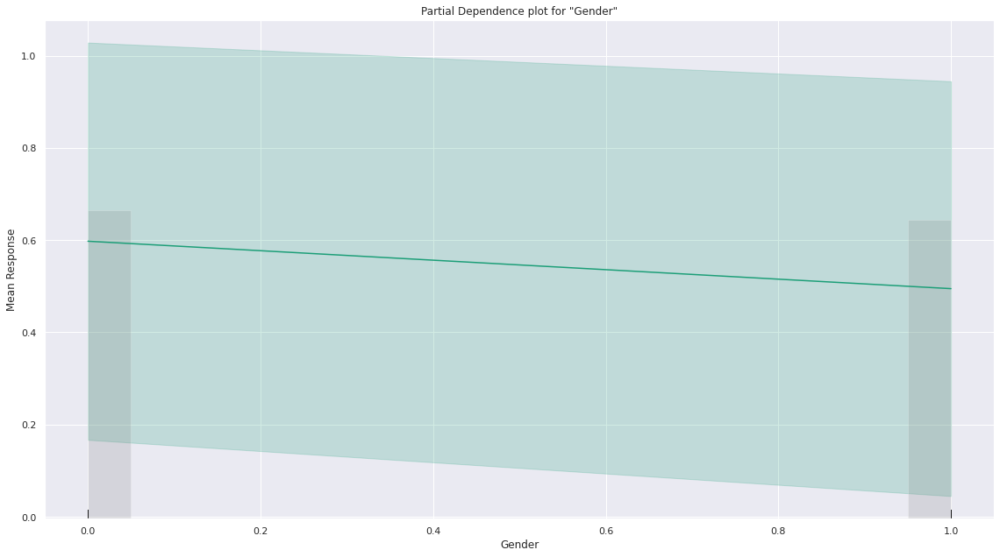

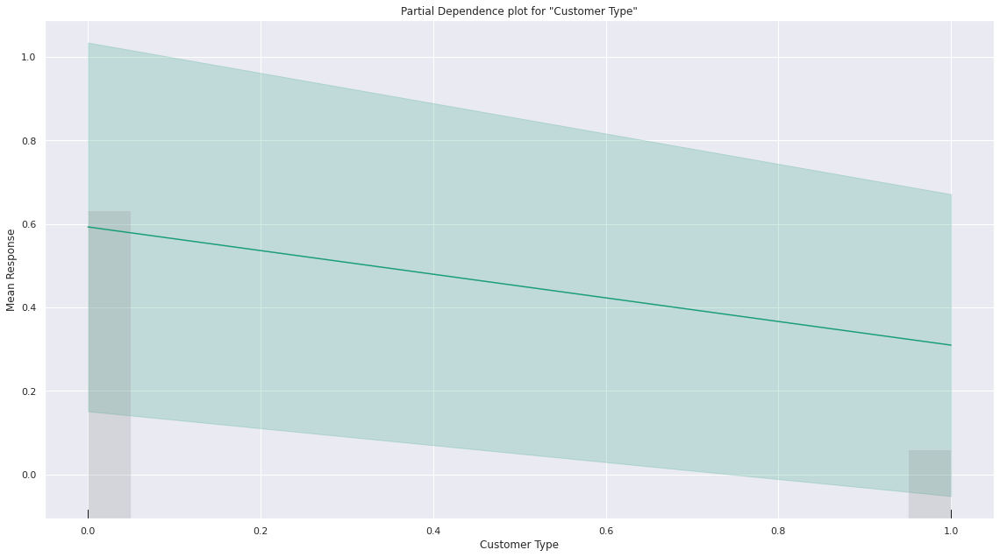

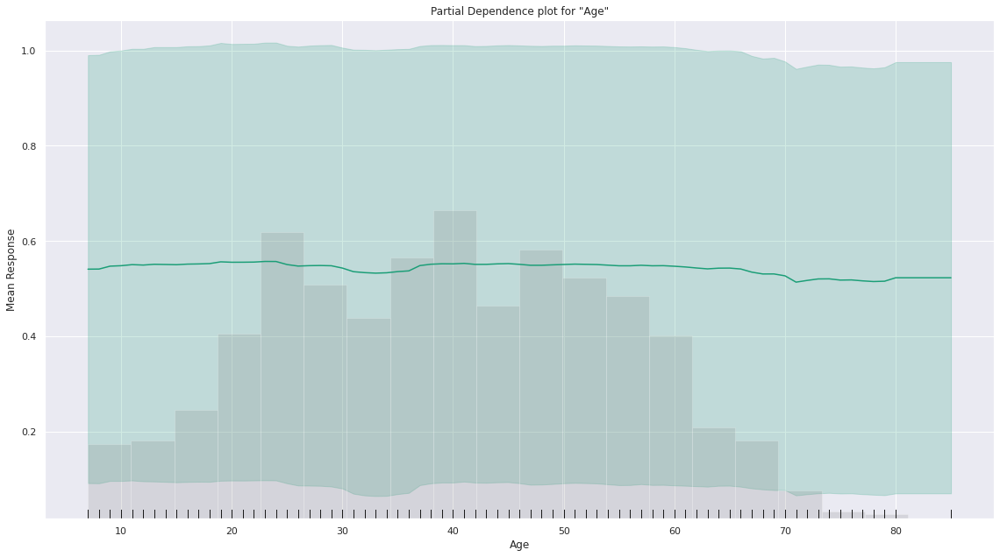

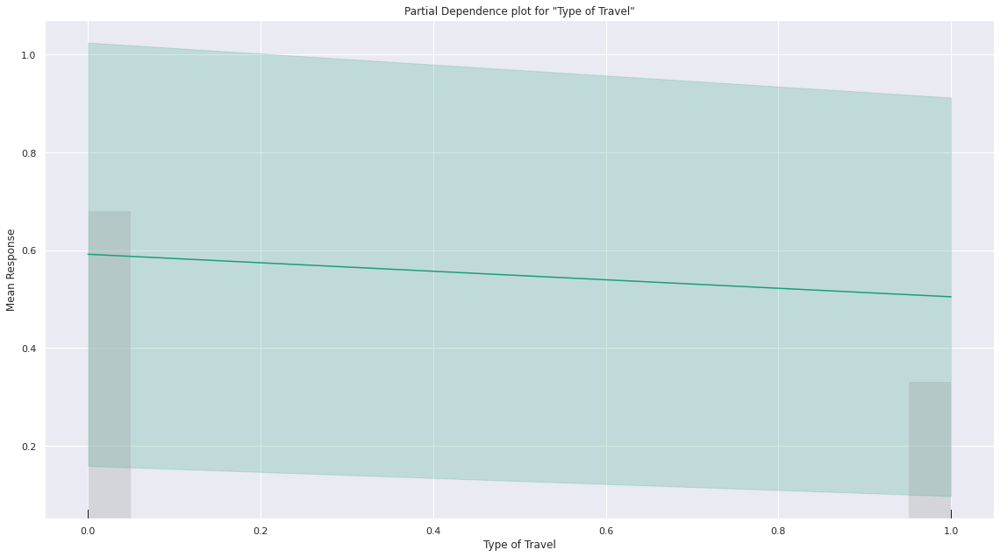

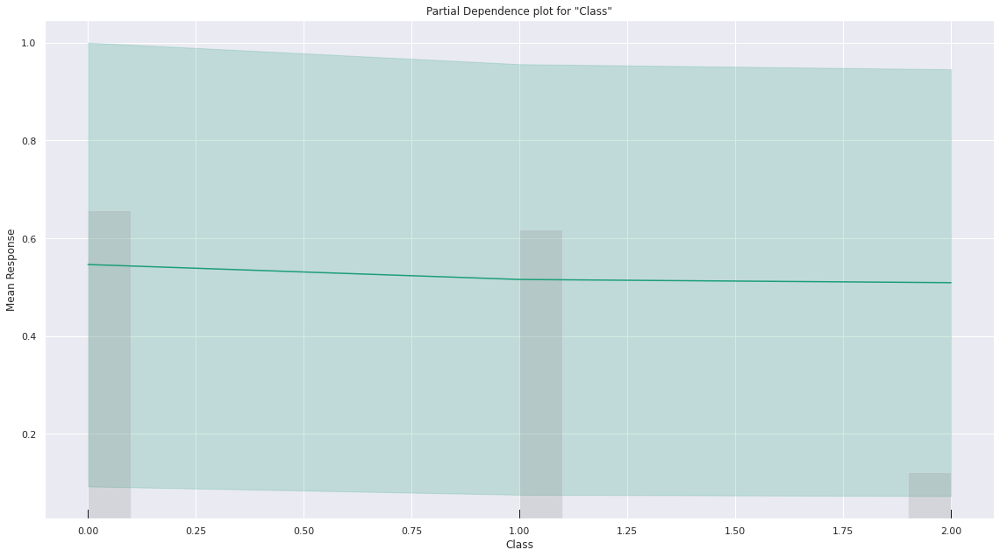

...

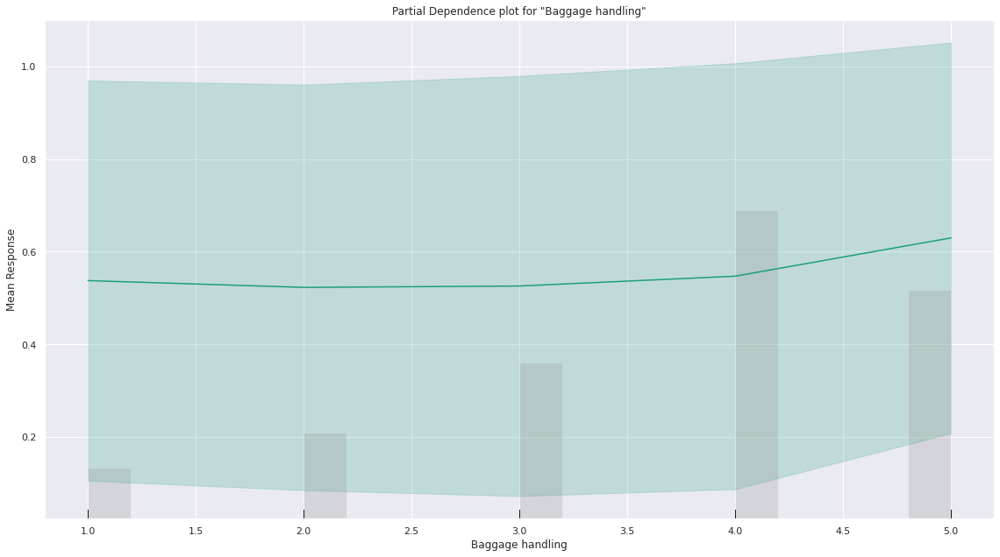

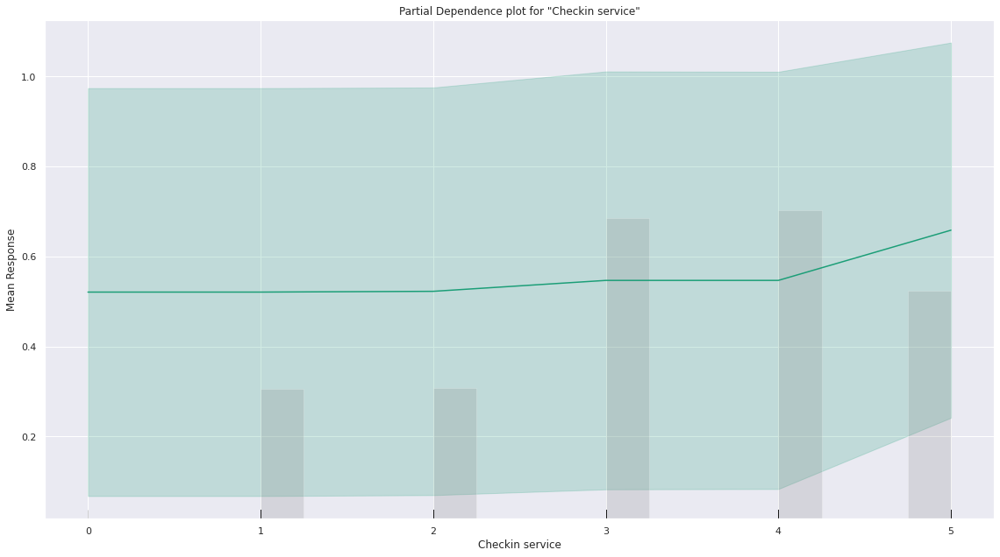

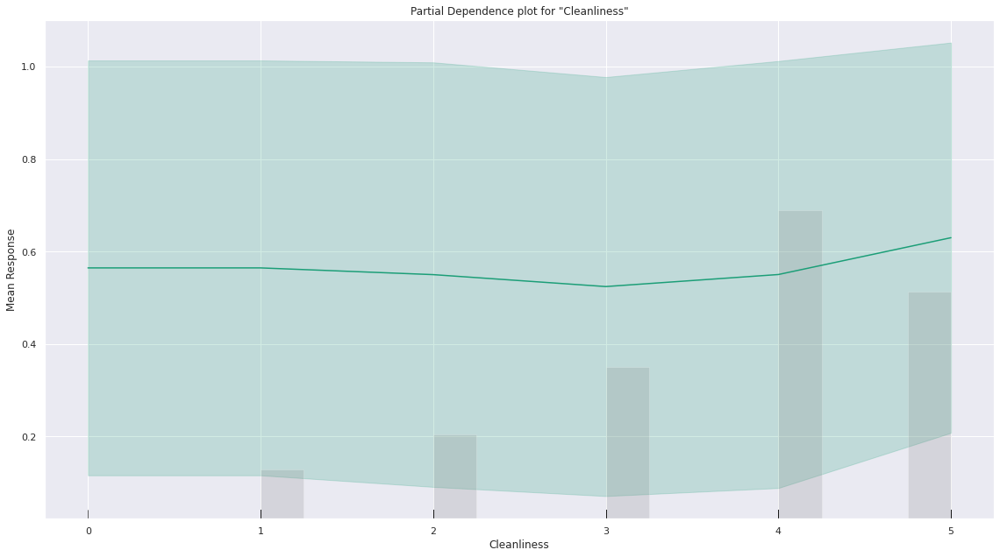

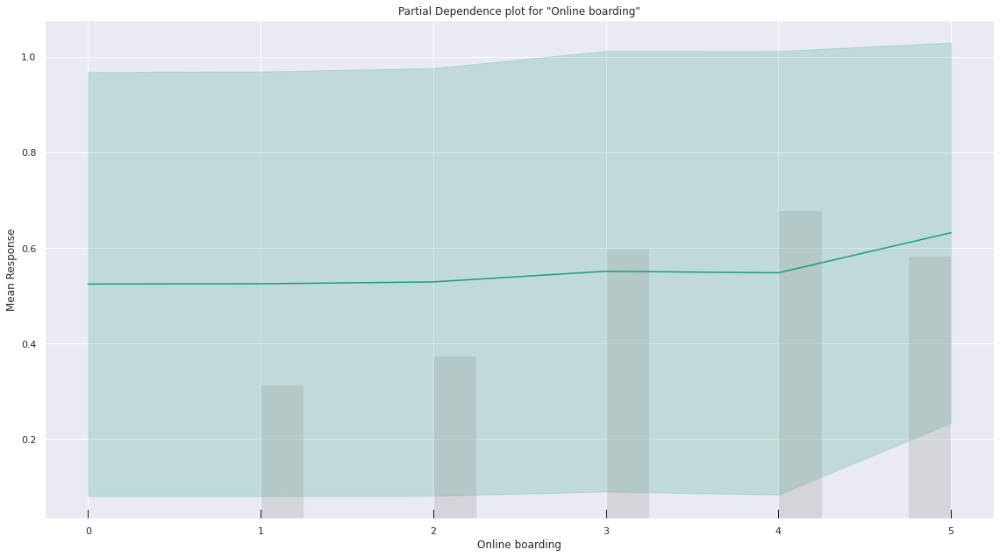

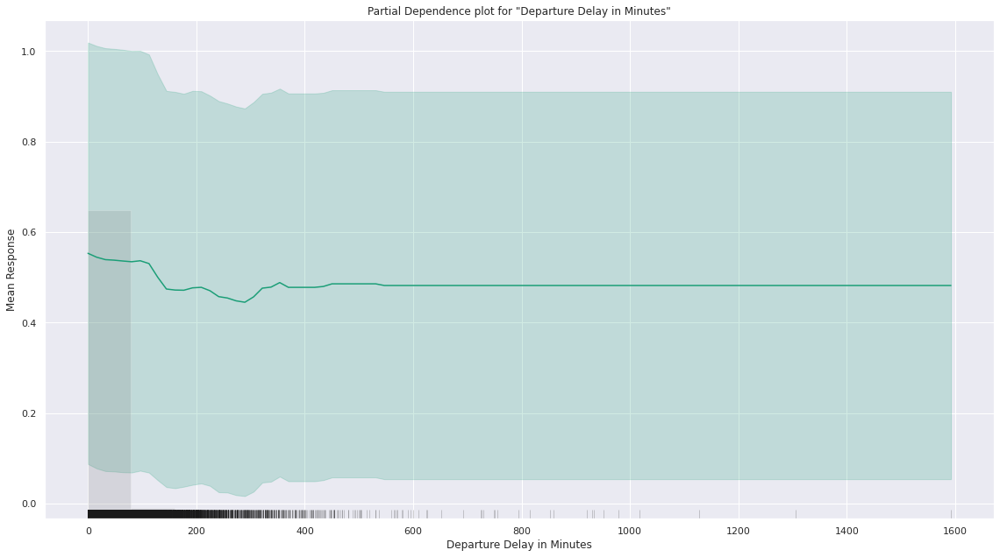

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

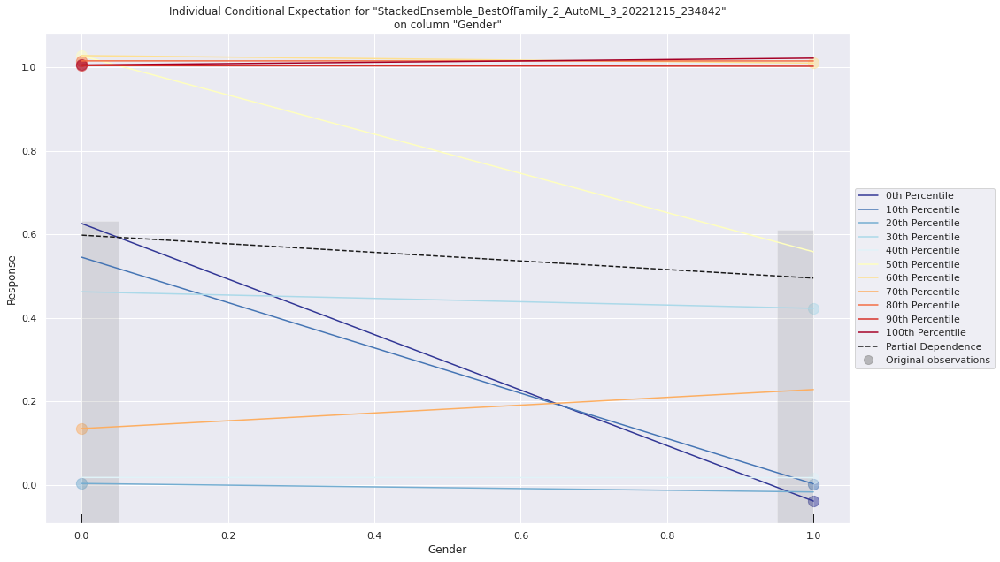

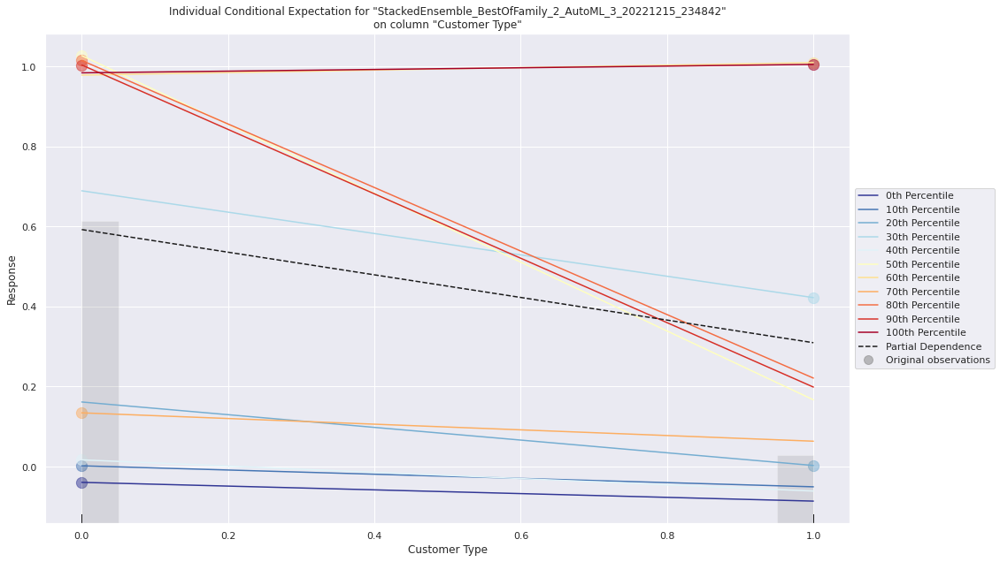

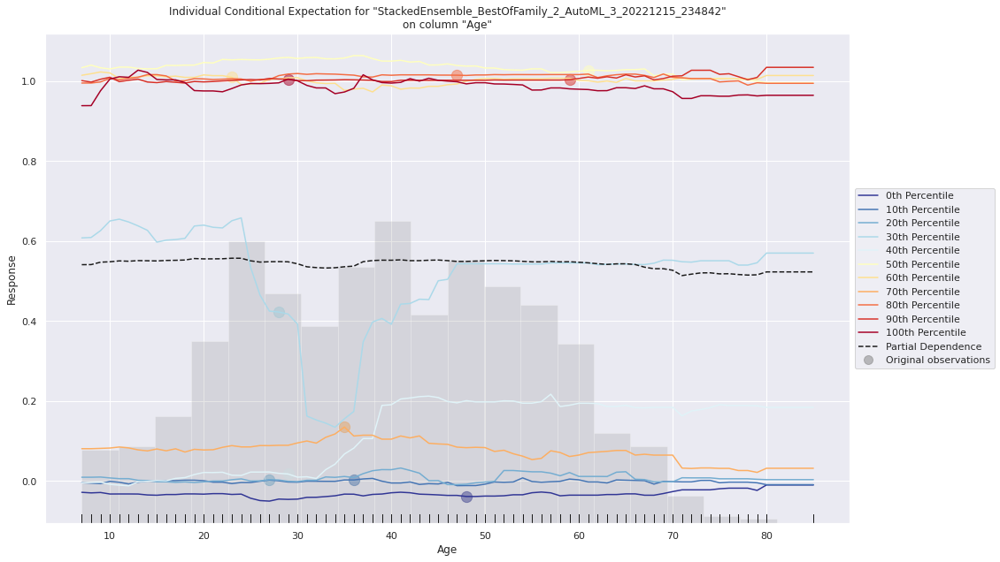

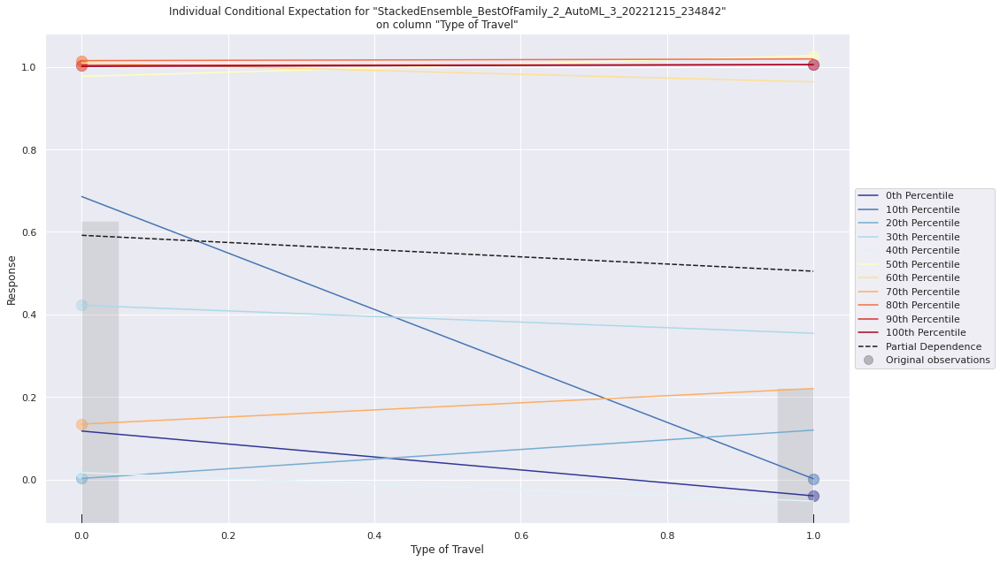

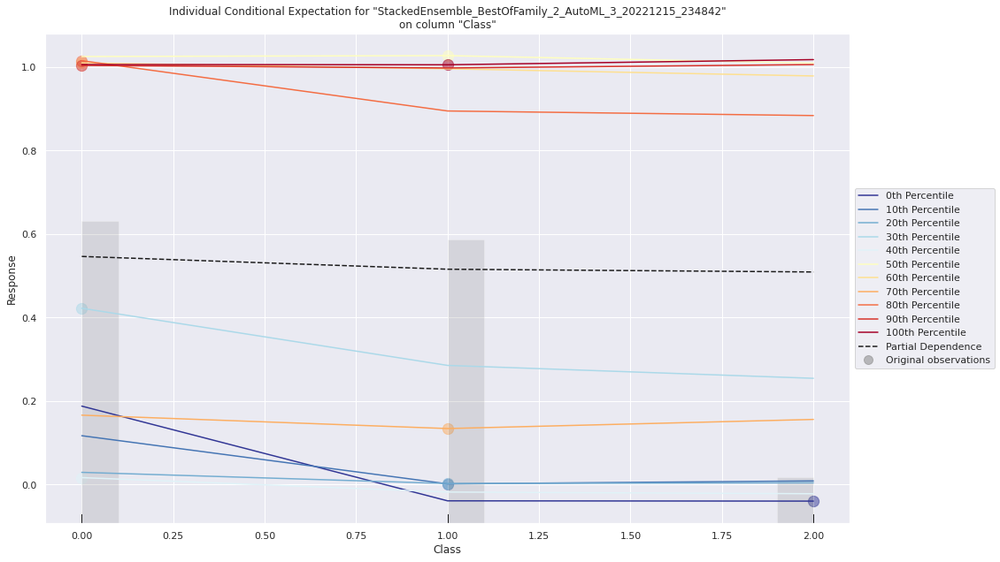

...

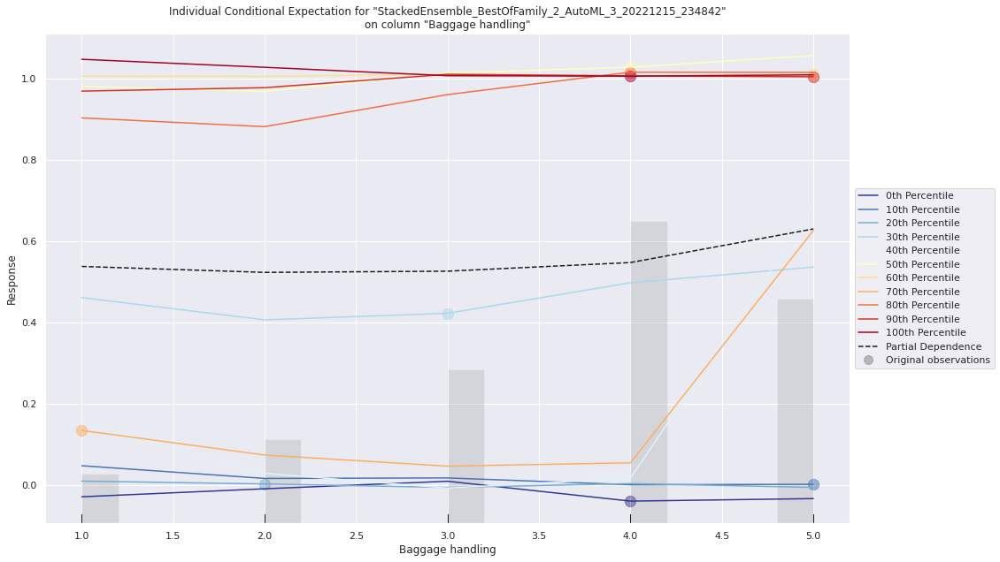

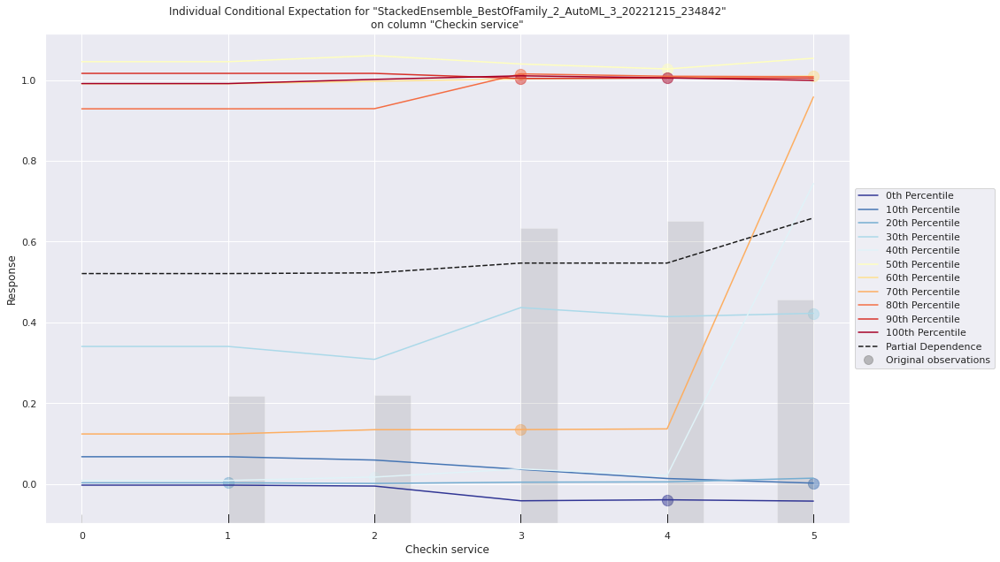

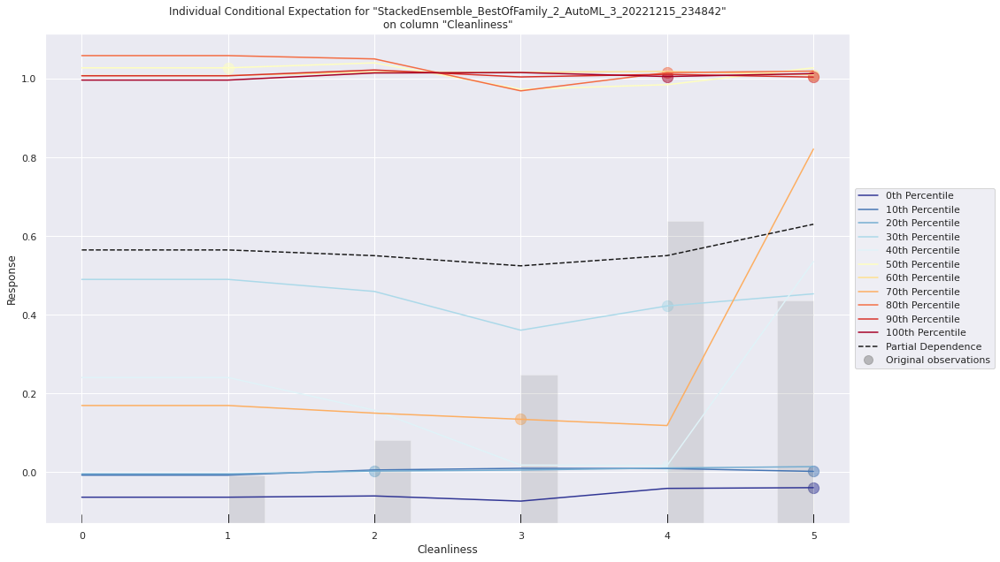

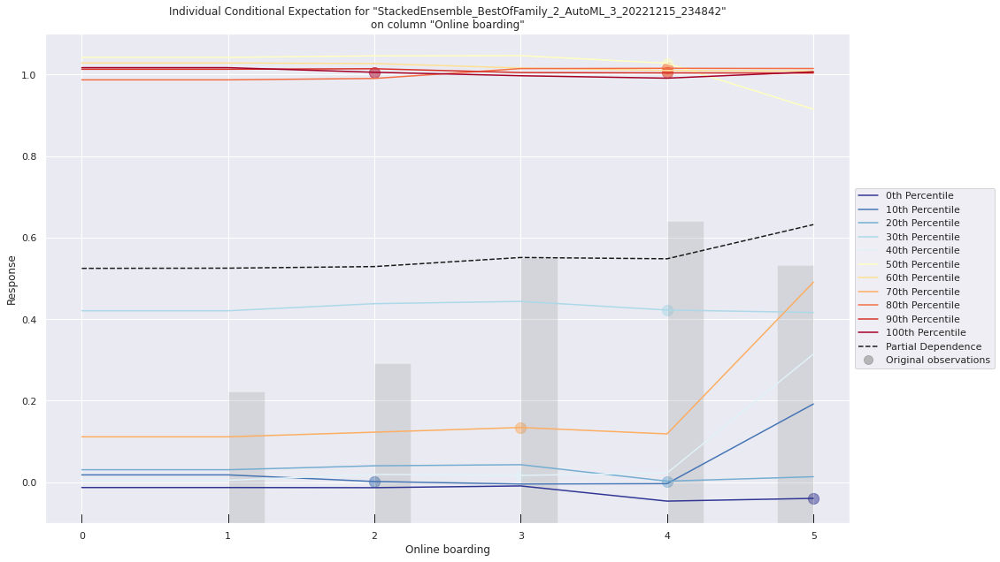

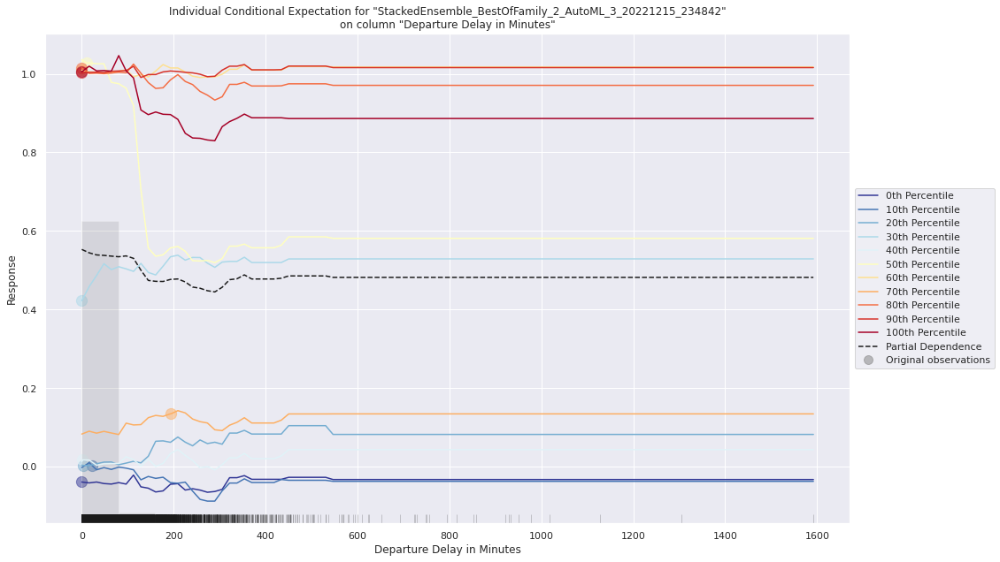

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [ ]:
aml.leader.explain(data)

### LightGBM

In [ ]:
#Vizuallise feature importances with Shap (global)
explainer = shap.TreeExplainer(lgbm)
shap_values = explainer.shap_values(test_x)

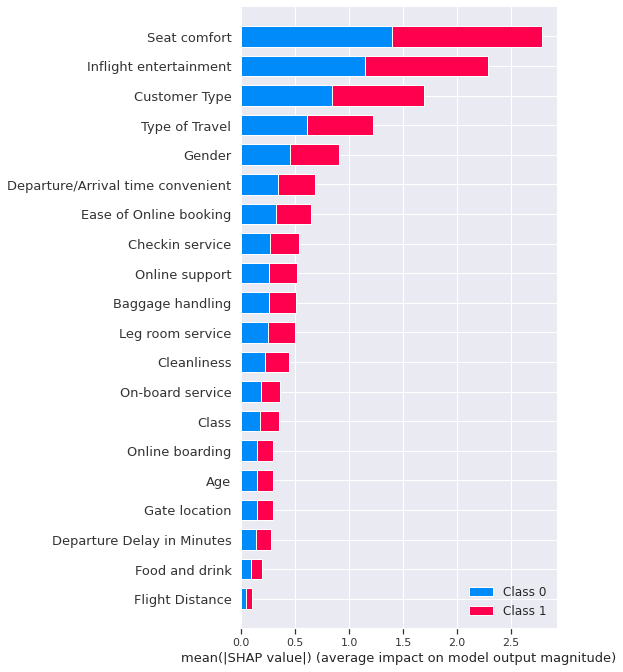

<Figure size 432x288 with 0 Axes>

In [ ]:
shap.initjs()
plt.figure(figsize=(7,6))
shap.summary_plot(shap_values, test_x)
plt.tight_layout()
plt.show()

In [ ]:
#visualize the test set predictions
shap.initjs()
test_sample = test_x.iloc[:100,:]
shap_values_sample = explainer.shap_values(test_sample)
shap.force_plot(explainer.expected_value[0], shap_values_sample[0], test_sample, link="logit")

In [ ]:
#visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_sample[0], test_sample, link="logit")

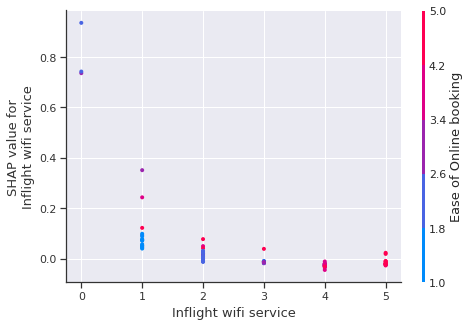

In [ ]:
#Vizualize the importance of a variable across the entire data set
shap.initjs()
shap.dependence_plot("Inflight wifi service", shap_values_sample[0], test_sample)

## Model Evaluation

In [ ]:
modified_data.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes'],
      dtype='object')

In [ ]:
logisreg_clf = LogisticRegression()
dt_clf = DecisionTreeClassifier()
XGB_clf = XGBClassifier()

In [ ]:
clf_list = [logisreg_clf, dt_clf, XGB_clf]
clf_name_list = ['Logistic Regression', 'Decision Tree', 'XGBClassifier']

for clf in clf_list:
    clf.fit(X_train,y_train)

In [ ]:
train_acc_list = []
test_acc_list = []

for clf,name in zip(clf_list,clf_name_list):
    y_pred_train = clf.predict(X_train)
    y_pred_test = clf.predict(X_test)
    print(f'Using model: {name}')
    print(f'Trainning Score: {clf.score(X_train, y_train)}')
    print(f'Test Score: {clf.score(X_test, y_test)}')
    print(f'Acc Train: {accuracy_score(y_train, y_pred_train)}')
    print(f'Acc Test: {accuracy_score(y_test, y_pred_test)}')
    train_acc_list.append(accuracy_score(y_train, y_pred_train))
    test_acc_list.append(accuracy_score(y_test, y_pred_test))
    print('======================================================')

Using model: Logistic Regression
Trainning Score: 0.8243323507413437
Test Score: 0.8228877938609999
Acc Train: 0.8243323507413437
Acc Test: 0.8228877938609999
Using model: Decision Tree
Trainning Score: 0.9613709358088786
Test Score: 0.9302946309413818
Acc Train: 0.9613709358088786
Acc Test: 0.9302946309413818
Using model: XGBClassifier
Trainning Score: 0.9120286858198777
Test Score: 0.9126886356636895
Acc Train: 0.9120286858198777
Acc Test: 0.9126886356636895


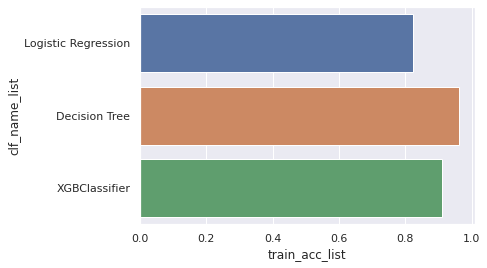

In [ ]:
clf_name_list = np.array([clf_name_list]).reshape(3,1)
train_acc_list = np.array([train_acc_list]).reshape(3,1)
df = pd.DataFrame(clf_name_list,columns=["clf_name_list"])
df["train_acc_list"] = train_acc_list
sns.barplot(data=df,y="clf_name_list",x="train_acc_list");

## So, What have we learned so far?(Final Answers)

1. What is the question?

 Ans: Customer satisfaction is always top of mind for airlines. Unhappy or disengaged customers naturally mean fewer passengers and less revenue. It’s important that customers have an excellent experience every time they travel. Higher customer satisfaction increases customer loyalty, resulting in customers who are willing to purchase more and spend more on products and services. The dataset consists of the details of customers who have already flown with them. This data given by an airline organization. The actual name of the company is not given due to various purposes that's why the name Invistico airlines. The feedback of the customers on various context and their flight data has been consolidated. 
  **The main purpose of this dataset is to predict whether a future customer would be satisfied with their service given the details of the other parameters values. Also the airlines need to know on which aspect of the services offered by them have to be emphasized more to generate more satisfied customers.**

2. What did you do?

  Ans: I worked on this dataset to build a supervised learning classification model to predict whether a future customer would be satisfied with the services provided by the airlines and also gathered the information about the features which are affecting the satisfaction level of the customers.
I broke the problem into a procedural flow and approached the basic principles/steps of building machine learning model starting from analyzing the data to model evaluation. Going further, after completing the routine EDA(Exploratory Data Analysis) and data cleaning which involves steps like finding the number of predictors, nulls, data types then building the various plots like unique value plot, distribution plot, correlation plot and finding the outliers and collecting the important features, 

  I created the following base models:

  Baseline Model(Logistic Regression)

  Tree Based Model(Decision Tree Classifier)

  AutoML

  Boosted Tree Based Model

  Then, I did the interpretations of these models using SHAP analysis where I built various plots like summary plot, force plot, decision plot, etc for each model and finally compared these models.
 

3. How well did it work?

  After comparing the various models, I looked for the metrics of each model and with the Accuracy of 93% the Tree Based Model worked best among all the other models.

  Using model: **Logistic Regression**

  Trainning Score: 0.8243323507413437

  Test Score: 0.8228877938609999
  
  Acc Train: 0.8243323507413437
  
  Acc Test: 0.8228877938609999

  Using model: **Decision Tree**
  
  Trainning Score: 0.9613709358088786
  
  Test Score: 0.9302946309413818
  
  Acc Train: 0.9613709358088786
  
  Acc Test: 0.9302946309413818

  Using model: **XGBClassifier**
  
  Trainning Score: 0.9120286858198777
  
  Test Score: 0.9126886356636895
  
  Acc Train: 0.9120286858198777
  
  Acc Test: 0.9126886356636895

  
4. What did you learn?

 Ans: To successfully build a machine learning model and to get deeper insights about various models and algorithms like XGBoost, LightGBM, Decision Trees then interpreting the models with SHAP analysis and using the AutoML which is very robust and easy to understand. Not only this, by completing this assignment I also got my hands pretty clean with the python language. 


## Conclusion

Passengers also appear to be sensitive to certain aspects of their services and as such the airline should tackle such issues as a priority to improve services.

This includes inflight wifi and departure time. That said, if the airline wishes to continue to focus on business travellers aspects such as online booking and seat comfort should be prioritised.

After this assignment we can confidently say that SHAP is a great tool as it offers high interpretibility. As a solution to the difficulties of explaining machine learning, SHAP analysis can help engineers understand the effect of the inputs of the model and give further insights into the systems they are building, making it another valuable tool in the engineer’s toolbox

SHAP analysis can be applied to the data from any machine learning model. It gives an indication of the relationships that combine to create the model’s output and you can gain real insights into the relationships

By plotting various plots like summary plots, force plots, dependence plots for all the three models we got deeper insights about the data.

## Refernces
1. Sckit learn offcial documentation
2. Refered Towards Data Science
  
  The algorithms were referred directly from the Sckit learn official documentation. The remaining code was written independently. Feature Engineering reference is taken from sklearn offical documnetation

3. https://towardsdatascience.com/explaining-scikit-learn-models-with-shap-61daff21b12a
4. https://shap-lrjball.readthedocs.io/en/latest/examples.html
5. https://plotly.com/python/templates/
6. https://www.simplilearn.com/tutorials/machine-learning-tutorial/decision-tree-in-python

Copyright 2022 Shivani Shekhawat

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.